In [ ]:
import os
import zipfile
import pandas as pd
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define paths (MODIFY THESE TO MATCH YOUR ACTUAL FILE PATHS)
drive_root = '/content/drive/MyDrive/'  # Adjust if your files are in a subfolder
train_zip_path = os.path.join(drive_root, 'training_set.zip')
train_csv_path = os.path.join(drive_root, 'training_set_pixel_size_and_HC.csv')

# Verify files exist
print("Checking if files exist...")
print(f"Train zip exists: {os.path.exists(train_zip_path)}")
print(f"Train CSV exists: {os.path.exists(train_csv_path)}")

# Create directories
base_dir = '/content/data'
os.makedirs(base_dir, exist_ok=True)

train_dir = os.path.join(base_dir, 'train')
train_images_dir = os.path.join(train_dir, 'images')
train_masks_dir = os.path.join(train_dir, 'masks')

os.makedirs(train_images_dir, exist_ok=True)
os.makedirs(train_masks_dir, exist_ok=True)

# Extract training data
print("\nExtracting training data...")
try:
    with zipfile.ZipFile(train_zip_path, 'r') as zip_ref:
        zip_ref.extractall(train_dir)
    print("Training data extracted successfully!")
    print("Contents of train directory:")
    print(os.listdir(train_dir))
except Exception as e:
    print(f"Error extracting training data: {e}")

# Load CSV file
print("\nLoading CSV file...")
try:
    train_csv = pd.read_csv(train_csv_path)
    print("Training CSV loaded successfully!")
    print(f"Found {len(train_csv)} entries in training CSV")
except Exception as e:
    print(f"Error loading training CSV: {e}")
    train_csv = None

# Organize files with more robust checking
print("\nOrganizing files...")

def find_files(directory, pattern):
    """Find all files in directory matching pattern"""
    matches = []
    for root, _, files in os.walk(directory):
        for f in files:
            if f.endswith(pattern):
                matches.append(os.path.join(root, f))
    return matches

# Find all PNGs in train directory
train_pngs = find_files(train_dir, '.png')
print(f"Found {len(train_pngs)} PNG files in train directory")

# Move files to appropriate folders
moved_images = 0
moved_masks = 0

for filepath in train_pngs:
    filename = os.path.basename(filepath)
    try:
        if '_Annotation' in filename:
            new_path = os.path.join(train_masks_dir, filename)
            os.rename(filepath, new_path)
            moved_masks += 1
        else:
            new_path = os.path.join(train_images_dir, filename)
            os.rename(filepath, new_path)
            moved_images += 1
    except Exception as e:
        print(f"Error moving {filename}: {e}")

print(f"Moved {moved_images} images to {train_images_dir}")
print(f"Moved {moved_masks} masks to {train_masks_dir}")

# Final verification
print("\nFinal verification:")
print(f"Training images: {len(os.listdir(train_images_dir))}")
print(f"Training masks: {len(os.listdir(train_masks_dir))}")

if train_csv is not None:
    print("\nSample training CSV data:")
    print(train_csv.head())


Mounted at /content/drive
Checking if files exist...
Train zip exists: True
Train CSV exists: True

Extracting training data...
Training data extracted successfully!
Contents of train directory:
['masks', 'training_set', 'images']

Loading CSV file...
Training CSV loaded successfully!
Found 999 entries in training CSV

Organizing files...
Found 1998 PNG files in train directory
Moved 999 images to /content/data/train/images
Moved 999 masks to /content/data/train/masks

Final verification:
Training images: 999
Training masks: 999

Sample training CSV data:
     filename  pixel size(mm)  head circumference (mm)
0  000_HC.png        0.069136                    44.30
1  001_HC.png        0.089659                    56.81
2  002_HC.png        0.062033                    68.75
3  003_HC.png        0.091291                    69.00
4  004_HC.png        0.061240                    59.81


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 6.9 MB/s eta 0:00:00
Found 999 images and 999 masks

Sample 1:
Image: 000_HC.png
Mask: 000_HC_Annotation.png


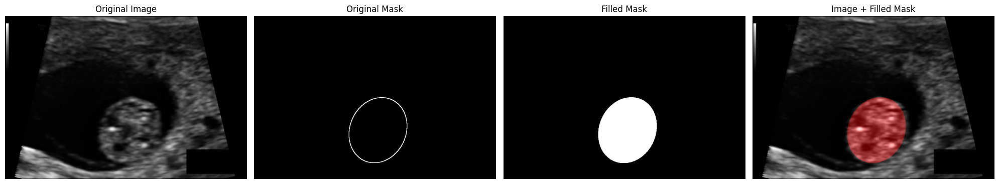


Sample 2:
Image: 001_HC.png
Mask: 001_HC_Annotation.png


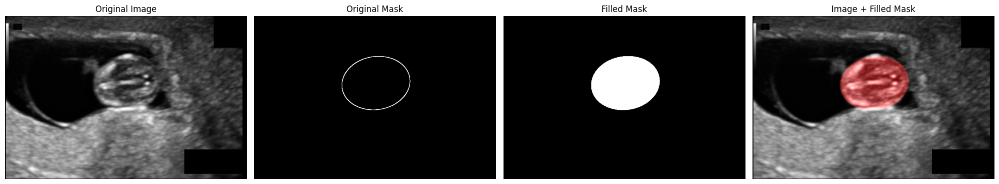


Sample 3:
Image: 002_HC.png
Mask: 002_HC_Annotation.png


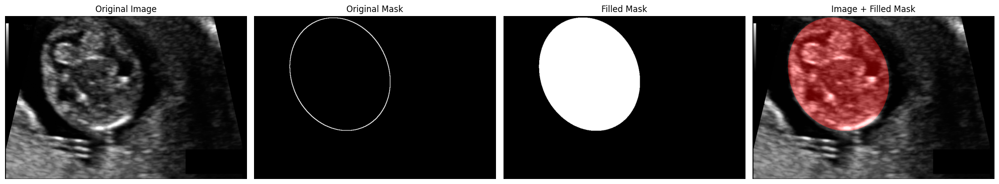

In [ ]:
!pip install opencv-python-headless --quiet
!pip install segmentation-models-pytorch --quiet
!pip install albumentations --quiet


import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
from glob import glob

# Set paths (modify if needed)
train_images_dir = '/content/data/train/images'
train_masks_dir = '/content/data/train/masks'

# Get sample images and masks
image_files = sorted(glob(os.path.join(train_images_dir, '*.png')))
mask_files = sorted(glob(os.path.join(train_masks_dir, '*_Annotation.png')))

# Verify we have matching pairs
if len(image_files) == 0 or len(mask_files) == 0:
    print("No images or masks found! Check your paths:")
    print(f"Images path: {train_images_dir}")
    print(f"Masks path: {train_masks_dir}")
else:
    print(f"Found {len(image_files)} images and {len(mask_files)} masks")

# Function to fill holes in a binary mask
def fill_holes(mask):
    """Fill holes in a binary mask using morphological closing and contour filling."""
    # Ensure mask is binary (0 or 255)
    _, binary_mask = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)

    # Find contours and fill them
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filled_mask = np.zeros_like(binary_mask)
    cv2.drawContours(filled_mask, contours, -1, 255, thickness=cv2.FILLED)

    # Alternatively, use morphological closing (kernel size may need adjustment)
    # kernel = np.ones((5, 5), np.uint8)
    # filled_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)

    return filled_mask

# Display function (now includes hole-filling)
def display_image_with_mask(image_path, mask_path, alpha=0.4):
    """Display image with mask overlay (after filling holes in the mask)."""
    # Read images
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    if image is None or mask is None:
        print(f"Could not read {image_path} or {mask_path}")
        return

    # Fill holes in the mask
    filled_mask = fill_holes(mask)

    # Create colored mask (red in this case)
    colored_mask = np.zeros((*filled_mask.shape, 3), dtype=np.uint8)
    colored_mask[filled_mask > 0] = [255, 0, 0]  # Red color

    # Convert grayscale image to RGB for visualization
    image_rgb = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)

    # Overlay mask
    overlayed = cv2.addWeighted(image_rgb, 1, colored_mask, alpha, 0)

    # Create figure
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))  # Now with 4 subplots

    # Display original image
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    # Display original mask (before filling holes)
    axes[1].imshow(mask, cmap='gray')
    axes[1].set_title('Original Mask')
    axes[1].axis('off')

    # Display filled mask (after processing)
    axes[2].imshow(filled_mask, cmap='gray')
    axes[2].set_title('Filled Mask')
    axes[2].axis('off')

    # Display overlay
    axes[3].imshow(overlayed)
    axes[3].set_title('Image + Filled Mask')
    axes[3].axis('off')

    plt.tight_layout()
    plt.show()

# Display first few samples
num_samples = min(3, len(image_files))
for i in range(num_samples):
    print(f"\nSample {i+1}:")
    print(f"Image: {os.path.basename(image_files[i])}")
    print(f"Mask: {os.path.basename(mask_files[i])}")
    display_image_with_mask(image_files[i], mask_files[i])

In [ ]:
import os
import cv2
import numpy as np
from tqdm import tqdm
from skimage import exposure
import albumentations as A
from sklearn.model_selection import train_test_split
from collections import defaultdict
import matplotlib.pyplot as plt
from glob import glob

# Configuration for 256x256 images
class Config:
    TARGET_SIZE = (256, 256)
    INPUT_IMAGES_DIR = '/content/data/train/images'
    INPUT_MASKS_DIR = '/content/data/train/masks'
    OUTPUT_DIR = '/content/data/split_preprocessed_256'

    AUGMENT = True
    NUM_AUGMENTATIONS = 5
    TEST_SIZE = 0.2
    VAL_SIZE = 0.2
    RANDOM_STATE = 42

# Create output directories
for subset in ['train', 'val', 'test']:
    for data_type in ['images', 'masks']:
        os.makedirs(os.path.join(Config.OUTPUT_DIR, subset, data_type), exist_ok=True)

class DataPreprocessor:
    def __init__(self):
        self.class_stats = defaultdict(list)
        self.augmentation_pipeline = self._create_augmentation_pipeline()

    def _create_augmentation_pipeline(self):
        """Create augmentation pipeline with foreground preservation"""
        return A.Compose([
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.Rotate(limit=30, p=0.5, interpolation=cv2.INTER_NEAREST),
            A.ShiftScaleRotate(
                shift_limit=0.05,
                scale_limit=0.1,
                rotate_limit=20,
                p=0.5,
                interpolation=cv2.INTER_NEAREST
            ),
            A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.3),
            A.CLAHE(clip_limit=3.0, p=0.3),
            A.GaussNoise(var_limit=5.0, p=0.1),
            A.OneOf([
                A.ElasticTransform(alpha=0.3, sigma=15, alpha_affine=8, p=0.2, interpolation=cv2.INTER_NEAREST),
                A.GridDistortion(num_steps=2, distort_limit=0.08, p=0.2, interpolation=cv2.INTER_NEAREST),
            ], p=0.3),
        ], additional_targets={'mask': 'mask'})

    def _fill_holes(self, mask):
        """Fill holes in a binary mask using contour filling."""
        _, binary_mask = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)
        contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        filled_mask = np.zeros_like(binary_mask)
        cv2.drawContours(filled_mask, contours, -1, 255, thickness=cv2.FILLED)
        return filled_mask

    def _enhance_foreground(self, image, mask):
        """Apply techniques to enhance visibility of rare foreground."""
        if np.mean(mask) < 0.01:
            fg_pixels = image[mask > 0]
            if len(fg_pixels) > 5:
                p2, p98 = np.percentile(fg_pixels, (2, 98))
                if p98 - p2 > 3:
                    image = exposure.rescale_intensity(image, in_range=(p2, p98), out_range=(0, 255)).astype(np.uint8)
            gamma = np.clip(0.6 + np.random.rand()*0.3, 0.6, 0.9)
            image = exposure.adjust_gamma(image, gamma=gamma)
            if np.random.rand() > 0.7:
                kernel = np.array([[-1,-1,-1], [-1,10,-1], [-1,-1,-1]]) / 10.0
                fg_regions = cv2.bitwise_and(image, image, mask=mask.astype(np.uint8))
                sharpened = cv2.filter2D(fg_regions, -1, kernel)
                image = cv2.addWeighted(image, 0.85, sharpened, 0.15, 0)
                image = np.clip(image, 0, 255)
        return image, mask

    def process_dataset(self):
        """Process and split the dataset."""
        image_files = sorted(glob(os.path.join(Config.INPUT_IMAGES_DIR, '*.png')))
        mask_files = sorted(glob(os.path.join(Config.INPUT_MASKS_DIR, '*.png')))

        data_pairs = list(zip(image_files, mask_files))
        train_pairs, test_pairs = train_test_split(data_pairs, test_size=Config.TEST_SIZE, random_state=Config.RANDOM_STATE)
        train_pairs, val_pairs = train_test_split(train_pairs, test_size=Config.VAL_SIZE / (1 - Config.TEST_SIZE), random_state=Config.RANDOM_STATE)

        self._process_subset(train_pairs, 'train')
        self._process_subset(val_pairs, 'val')
        self._process_subset(test_pairs, 'test')

    def _process_subset(self, pairs, subset):
        """Process and save a subset (train, val, or test)."""
        for image_path, mask_path in tqdm(pairs, desc=f"Processing {subset}"):
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

            # Fill holes in the mask before processing
            mask = self._fill_holes(mask)

            # Resize to target size
            image = cv2.resize(image, Config.TARGET_SIZE, interpolation=cv2.INTER_AREA)
            mask = cv2.resize(mask, Config.TARGET_SIZE, interpolation=cv2.INTER_NEAREST)

            # Enhance foreground (if enabled)
            image, mask = self._enhance_foreground(image, mask)

            # Data augmentation (if enabled)
            if Config.AUGMENT and subset == 'train':
                for i in range(Config.NUM_AUGMENTATIONS):
                    augmented = self.augmentation_pipeline(image=image, mask=mask)
                    self._save_image_mask_pair(augmented['image'], augmented['mask'], subset, image_path, mask_path, is_augmented=True)

            # Save original (and augmented if applicable) image and mask
            self._save_image_mask_pair(image, mask, subset, image_path, mask_path)

    def _save_image_mask_pair(self, image, mask, subset, image_path, mask_path, is_augmented=False):
        """Save image and mask to the appropriate directory."""
        filename_base = os.path.splitext(os.path.basename(image_path))[0]
        if is_augmented:
            filename_base += f"_aug_{i}"

        image_output_path = os.path.join(Config.OUTPUT_DIR, subset, 'images', f"{filename_base}.png")
        mask_output_path = os.path.join(Config.OUTPUT_DIR, subset, 'masks', f"{filename_base}.png")

        cv2.imwrite(image_output_path, image)
        cv2.imwrite(mask_output_path, mask)

if __name__ == "__main__":
    preprocessor = DataPreprocessor()
    preprocessor.process_dataset()

/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/tmp/ipython-input-2142060390.py:50: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=5.0, p=0.1),
/tmp/ipython-input-2142060390.py:52: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  A.ElasticTransform(alpha=0.3, sigma=15, alpha_affine=8, p=0.2, interpolation=cv2.INTER_NEAREST),
Processing test: 100%|██████████| 200/200 [00:02<00:00, 84.60it/s] 


In [ ]:
!pip install segmentation-models-pytorch --quiet
!pip install albumentations --quiet


Using device: cuda
Model Parameters: 6.47M
Starting training...


Epoch 1/50: 100%|██████████| 599/599 [00:53<00:00, 11.15it/s]



Epoch 1:
Train - Loss: 0.6987, Dice: 0.9440, IoU: 0.9012
Val - Dice: 0.9675, IoU: 0.9388
Saved best model with Val Dice: 0.9675


Epoch 2/50: 100%|██████████| 599/599 [00:52<00:00, 11.50it/s]



Epoch 2:
Train - Loss: 0.6193, Dice: 0.9717, IoU: 0.9467
Val - Dice: 0.9709, IoU: 0.9451
Saved best model with Val Dice: 0.9709


Epoch 3/50: 100%|██████████| 599/599 [00:54<00:00, 11.02it/s]



Epoch 3:
Train - Loss: 0.6143, Dice: 0.9742, IoU: 0.9516
Val - Dice: 0.9706, IoU: 0.9448


Epoch 4/50: 100%|██████████| 599/599 [00:53<00:00, 11.18it/s]



Epoch 4:
Train - Loss: 0.6149, Dice: 0.9735, IoU: 0.9500
Val - Dice: 0.9733, IoU: 0.9494
Saved best model with Val Dice: 0.9733


Epoch 5/50: 100%|██████████| 599/599 [00:53<00:00, 11.14it/s]



Epoch 5:
Train - Loss: 0.6141, Dice: 0.9743, IoU: 0.9520
Val - Dice: 0.9742, IoU: 0.9511
Saved best model with Val Dice: 0.9742


Epoch 6/50: 100%|██████████| 599/599 [00:53<00:00, 11.17it/s]



Epoch 6:
Train - Loss: 0.6662, Dice: 0.9333, IoU: 0.8861
Val - Dice: 0.9467, IoU: 0.9038


Epoch 7/50: 100%|██████████| 599/599 [00:53<00:00, 11.17it/s]



Epoch 7:
Train - Loss: 0.6483, Dice: 0.9474, IoU: 0.9058
Val - Dice: 0.9561, IoU: 0.9213


Epoch 8/50: 100%|██████████| 599/599 [00:53<00:00, 11.19it/s]



Epoch 8:
Train - Loss: 0.6431, Dice: 0.9510, IoU: 0.9128
Val - Dice: 0.9543, IoU: 0.9180


Epoch 9/50: 100%|██████████| 599/599 [00:53<00:00, 11.17it/s]



Epoch 9:
Train - Loss: 0.6395, Dice: 0.9542, IoU: 0.9173
Val - Dice: 0.9608, IoU: 0.9281


Epoch 10/50: 100%|██████████| 599/599 [00:53<00:00, 11.15it/s]



Epoch 10:
Train - Loss: 0.6390, Dice: 0.9543, IoU: 0.9176
Val - Dice: 0.9508, IoU: 0.9126


Epoch 11/50: 100%|██████████| 599/599 [00:53<00:00, 11.19it/s]



Epoch 11:
Train - Loss: 0.6361, Dice: 0.9566, IoU: 0.9217
Val - Dice: 0.9527, IoU: 0.9146


Epoch 12/50: 100%|██████████| 599/599 [00:53<00:00, 11.20it/s]



Epoch 12:
Train - Loss: 0.6354, Dice: 0.9569, IoU: 0.9217
Val - Dice: 0.9581, IoU: 0.9236


Epoch 13/50: 100%|██████████| 599/599 [00:53<00:00, 11.22it/s]



Epoch 13:
Train - Loss: 0.6367, Dice: 0.9559, IoU: 0.9204
Val - Dice: 0.9584, IoU: 0.9232


Epoch 14/50: 100%|██████████| 599/599 [00:53<00:00, 11.24it/s]



Epoch 14:
Train - Loss: 0.6311, Dice: 0.9602, IoU: 0.9277
Val - Dice: 0.9648, IoU: 0.9347


Epoch 15/50: 100%|██████████| 599/599 [00:53<00:00, 11.26it/s]



Epoch 15:
Train - Loss: 0.6300, Dice: 0.9613, IoU: 0.9293
Val - Dice: 0.9660, IoU: 0.9373


Epoch 16/50: 100%|██████████| 599/599 [00:53<00:00, 11.22it/s]



Epoch 16:
Train - Loss: 0.6355, Dice: 0.9568, IoU: 0.9222
Val - Dice: 0.9675, IoU: 0.9405


Epoch 17/50: 100%|██████████| 599/599 [00:53<00:00, 11.25it/s]



Epoch 17:
Train - Loss: 0.6329, Dice: 0.9590, IoU: 0.9252
Val - Dice: 0.9620, IoU: 0.9311


Epoch 18/50: 100%|██████████| 599/599 [00:53<00:00, 11.23it/s]



Epoch 18:
Train - Loss: 0.6327, Dice: 0.9592, IoU: 0.9254
Val - Dice: 0.9610, IoU: 0.9301


Epoch 19/50: 100%|██████████| 599/599 [00:53<00:00, 11.23it/s]



Epoch 19:
Train - Loss: 0.6310, Dice: 0.9604, IoU: 0.9273
Val - Dice: 0.9591, IoU: 0.9277


Epoch 20/50: 100%|██████████| 599/599 [00:53<00:00, 11.25it/s]



Epoch 20:
Train - Loss: 0.6282, Dice: 0.9626, IoU: 0.9313
Val - Dice: 0.9616, IoU: 0.9300


Epoch 21/50: 100%|██████████| 599/599 [00:53<00:00, 11.25it/s]



Epoch 21:
Train - Loss: 0.6335, Dice: 0.9582, IoU: 0.9242
Val - Dice: 0.9591, IoU: 0.9247


Epoch 22/50: 100%|██████████| 599/599 [00:53<00:00, 11.21it/s]



Epoch 22:
Train - Loss: 0.6330, Dice: 0.9586, IoU: 0.9244
Val - Dice: 0.9610, IoU: 0.9282


Epoch 23/50: 100%|██████████| 599/599 [00:53<00:00, 11.27it/s]



Epoch 23:
Train - Loss: 0.6301, Dice: 0.9608, IoU: 0.9283
Val - Dice: 0.9603, IoU: 0.9276


Epoch 24/50: 100%|██████████| 599/599 [00:53<00:00, 11.24it/s]



Epoch 24:
Train - Loss: 0.6269, Dice: 0.9634, IoU: 0.9327
Val - Dice: 0.9670, IoU: 0.9385


Epoch 25/50: 100%|██████████| 599/599 [00:56<00:00, 10.61it/s]



Epoch 25:
Train - Loss: 0.6329, Dice: 0.9586, IoU: 0.9251
Val - Dice: 0.9714, IoU: 0.9469


Epoch 26/50: 100%|██████████| 599/599 [00:53<00:00, 11.13it/s]



Epoch 26:
Train - Loss: 0.6265, Dice: 0.9635, IoU: 0.9332
Val - Dice: 0.9606, IoU: 0.9289


Epoch 27/50: 100%|██████████| 599/599 [00:53<00:00, 11.17it/s]



Epoch 27:
Train - Loss: 0.6303, Dice: 0.9608, IoU: 0.9284
Val - Dice: 0.9714, IoU: 0.9475


Epoch 28/50: 100%|██████████| 599/599 [00:53<00:00, 11.19it/s]



Epoch 28:
Train - Loss: 0.6273, Dice: 0.9628, IoU: 0.9320
Val - Dice: 0.9674, IoU: 0.9398


Epoch 29/50: 100%|██████████| 599/599 [00:53<00:00, 11.24it/s]



Epoch 29:
Train - Loss: 0.6267, Dice: 0.9637, IoU: 0.9340
Val - Dice: 0.9593, IoU: 0.9254


Epoch 30/50: 100%|██████████| 599/599 [00:53<00:00, 11.22it/s]



Epoch 30:
Train - Loss: 0.6284, Dice: 0.9622, IoU: 0.9305
Val - Dice: 0.9626, IoU: 0.9315


Epoch 31/50: 100%|██████████| 599/599 [00:53<00:00, 11.19it/s]



Epoch 31:
Train - Loss: 0.6283, Dice: 0.9625, IoU: 0.9313
Val - Dice: 0.9630, IoU: 0.9321


Epoch 32/50: 100%|██████████| 599/599 [00:53<00:00, 11.15it/s]



Epoch 32:
Train - Loss: 0.6289, Dice: 0.9619, IoU: 0.9302
Val - Dice: 0.9684, IoU: 0.9417


Epoch 33/50: 100%|██████████| 599/599 [00:53<00:00, 11.17it/s]



Epoch 33:
Train - Loss: 0.6288, Dice: 0.9620, IoU: 0.9305
Val - Dice: 0.9660, IoU: 0.9377


Epoch 34/50: 100%|██████████| 599/599 [00:53<00:00, 11.14it/s]



Epoch 34:
Train - Loss: 0.6249, Dice: 0.9649, IoU: 0.9358
Val - Dice: 0.9690, IoU: 0.9424


Epoch 35/50: 100%|██████████| 599/599 [00:53<00:00, 11.23it/s]



Epoch 35:
Train - Loss: 0.6250, Dice: 0.9649, IoU: 0.9361
Val - Dice: 0.9644, IoU: 0.9351


Epoch 36/50: 100%|██████████| 599/599 [00:53<00:00, 11.19it/s]



Epoch 36:
Train - Loss: 0.6264, Dice: 0.9637, IoU: 0.9335
Val - Dice: 0.9607, IoU: 0.9281


Epoch 37/50: 100%|██████████| 599/599 [00:53<00:00, 11.17it/s]



Epoch 37:
Train - Loss: 0.6299, Dice: 0.9609, IoU: 0.9284
Val - Dice: 0.9503, IoU: 0.9104


Epoch 38/50: 100%|██████████| 599/599 [00:53<00:00, 11.18it/s]



Epoch 38:
Train - Loss: 0.6210, Dice: 0.9683, IoU: 0.9409
Val - Dice: 0.9708, IoU: 0.9462


Epoch 39/50: 100%|██████████| 599/599 [00:53<00:00, 11.28it/s]



Epoch 39:
Train - Loss: 0.6267, Dice: 0.9635, IoU: 0.9330
Val - Dice: 0.9752, IoU: 0.9536
Saved best model with Val Dice: 0.9752


Epoch 40/50: 100%|██████████| 599/599 [00:53<00:00, 11.19it/s]



Epoch 40:
Train - Loss: 0.6242, Dice: 0.9653, IoU: 0.9372
Val - Dice: 0.9594, IoU: 0.9262


Epoch 41/50: 100%|██████████| 599/599 [00:53<00:00, 11.27it/s]



Epoch 41:
Train - Loss: 0.6258, Dice: 0.9643, IoU: 0.9341
Val - Dice: 0.9705, IoU: 0.9447


Epoch 42/50: 100%|██████████| 599/599 [00:53<00:00, 11.25it/s]



Epoch 42:
Train - Loss: 0.6279, Dice: 0.9625, IoU: 0.9315
Val - Dice: 0.9604, IoU: 0.9291


Epoch 43/50: 100%|██████████| 599/599 [00:53<00:00, 11.25it/s]



Epoch 43:
Train - Loss: 0.6237, Dice: 0.9657, IoU: 0.9370
Val - Dice: 0.9630, IoU: 0.9320


Epoch 44/50: 100%|██████████| 599/599 [00:53<00:00, 11.25it/s]



Epoch 44:
Train - Loss: 0.6219, Dice: 0.9671, IoU: 0.9393
Val - Dice: 0.9649, IoU: 0.9348


Epoch 45/50: 100%|██████████| 599/599 [00:53<00:00, 11.27it/s]



Epoch 45:
Train - Loss: 0.6267, Dice: 0.9634, IoU: 0.9329
Val - Dice: 0.9681, IoU: 0.9406


Epoch 46/50: 100%|██████████| 599/599 [00:53<00:00, 11.18it/s]



Epoch 46:
Train - Loss: 0.6258, Dice: 0.9644, IoU: 0.9348
Val - Dice: 0.9654, IoU: 0.9373


Epoch 47/50: 100%|██████████| 599/599 [00:53<00:00, 11.19it/s]



Epoch 47:
Train - Loss: 0.6229, Dice: 0.9666, IoU: 0.9385
Val - Dice: 0.9696, IoU: 0.9440


Epoch 48/50: 100%|██████████| 599/599 [00:53<00:00, 11.17it/s]



Epoch 48:
Train - Loss: 0.6265, Dice: 0.9637, IoU: 0.9329
Val - Dice: 0.9655, IoU: 0.9364


Epoch 49/50: 100%|██████████| 599/599 [00:53<00:00, 11.18it/s]



Epoch 49:
Train - Loss: 0.6245, Dice: 0.9651, IoU: 0.9361
Val - Dice: 0.9645, IoU: 0.9347


Epoch 50/50: 100%|██████████| 599/599 [00:53<00:00, 11.19it/s]



Epoch 50:
Train - Loss: 0.6280, Dice: 0.9626, IoU: 0.9316
Val - Dice: 0.9670, IoU: 0.9390


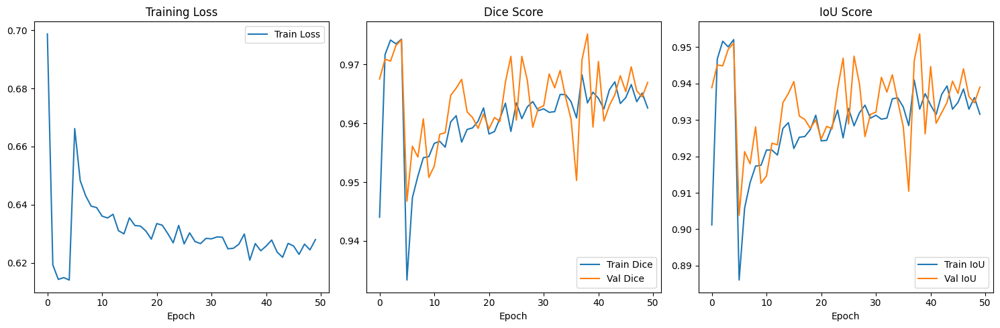

In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2
from tqdm import tqdm
import matplotlib.pyplot as plt
import math
from einops import rearrange

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Configuration
data_path = "/content/data/split_preprocessed_256"
model_save_path = "/content/drive/MyDrive/best_medsegdiff_gradcam.pth"
batch_size = 2
img_size = 256
epochs = 50
noise_steps = 500

# Dataset implementation
class SegmentationDataset(Dataset):
    def __init__(self, image_paths, mask_paths):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = A.Compose([
            A.Resize(img_size, img_size),
            A.HorizontalFlip(p=0.5),
            A.Normalize(mean=(0.5,), std=(0.5,)),
            ToTensorV2()
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = cv2.imread(self.image_paths[idx], cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(self.mask_paths[idx], cv2.IMREAD_GRAYSCALE)

        if image.ndim == 2:
            image = np.expand_dims(image, axis=-1)

        transformed = self.transform(image=image, mask=mask)
        image = transformed["image"].float()
        mask = transformed["mask"].float().unsqueeze(0) / 255.0

        return image, mask

def get_data_loaders():
    splits = ["train", "val", "test"]
    loaders = {}

    for split in splits:
        image_dir = os.path.join(data_path, split, "images")
        mask_dir = os.path.join(data_path, split, "masks")

        image_paths = sorted([os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith('.png')])
        mask_paths = sorted([os.path.join(mask_dir, f) for f in os.listdir(mask_dir) if f.endswith('.png')])

        dataset = SegmentationDataset(image_paths, mask_paths)
        loaders[split] = DataLoader(
            dataset,
            batch_size=batch_size,
            shuffle=(split == "train"),
            num_workers=2,
            pin_memory=True
        )

    return loaders['train'], loaders['val'], loaders['test']

# Model Components
class TimeEmbedding(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim
        half_dim = dim // 2
        emb = math.log(10000) / (half_dim - 1)
        emb = torch.exp(torch.arange(half_dim, dtype=torch.float) * -emb)
        self.register_buffer('emb', emb)

    def forward(self, time):
        emb = time.float()[:, None] * self.emb[None, :]  # [batch_size, half_dim]
        emb = torch.cat((emb.sin(), emb.cos()), dim=-1)  # [batch_size, dim]
        return emb

class AnchorSA(nn.Module):
    def __init__(self, channels, kernel_size=3):
        super().__init__()
        self.gaussian = nn.Conv2d(channels, channels, kernel_size,
                                padding=kernel_size//2,
                                groups=channels, bias=False)
        # Initialize as Gaussian kernel
        weights = torch.FloatTensor([[1, 2, 1],
                                    [2, 4, 2],
                                    [1, 2, 1]]) / 16.0
        with torch.no_grad():
            for i in range(channels):
                self.gaussian.weight[i] = weights
        self.gaussian.weight.requires_grad_(True)

    def forward(self, x_encoder, feat_cond):
        anchor = torch.max(self.gaussian(feat_cond), feat_cond)
        # Add .contiguous() calls
        return x_encoder.contiguous() + anchor.contiguous()

class SSFormerBlock(nn.Module):
    def __init__(self, d_model, n_heads):
        super().__init__()
        self.norm = nn.LayerNorm(d_model)
        self.cross_attn = nn.MultiheadAttention(d_model, n_heads, batch_first=True)
        self.ff = nn.Sequential(
            nn.Linear(d_model, d_model*4),
            nn.GELU(),
            nn.Linear(d_model*4, d_model),
        )

    def forward(self, noisy_emb, sem_emb):
        q = self.norm(noisy_emb)
        k = self.norm(sem_emb)
        v = sem_emb
        attn_out, _ = self.cross_attn(q, k, v)
        return noisy_emb + self.ff(attn_out)

class SSFormer(nn.Module):
    def __init__(self, d_model, n_heads, num_layers):
        super().__init__()
        self.layers = nn.ModuleList([SSFormerBlock(d_model, n_heads) for _ in range(num_layers)])

    def forward(self, noisy_emb, sem_emb):
        for layer in self.layers:
            noisy_emb = layer(noisy_emb, sem_emb)
        return noisy_emb

class ConditionModel(nn.Module):
    def __init__(self, in_channels=1, base_channels=32):
        super().__init__()
        # Encoder
        self.enc1 = nn.Sequential(
            nn.Conv2d(in_channels, base_channels, 3, padding=1),
            nn.GroupNorm(8, base_channels),
            nn.GELU(),
            nn.Conv2d(base_channels, base_channels, 3, padding=1),
            nn.GroupNorm(8, base_channels),
            nn.GELU()
        )
        self.down1 = nn.Conv2d(base_channels, base_channels*2, 2, stride=2)

        self.enc2 = nn.Sequential(
            nn.Conv2d(base_channels*2, base_channels*2, 3, padding=1),
            nn.GroupNorm(8, base_channels*2),
            nn.GELU(),
            nn.Conv2d(base_channels*2, base_channels*2, 3, padding=1),
            nn.GroupNorm(8, base_channels*2),
            nn.GELU()
        )
        self.down2 = nn.Conv2d(base_channels*2, base_channels*4, 2, stride=2)

        # Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(base_channels*4, base_channels*8, 3, padding=1),
            nn.GroupNorm(8, base_channels*8),
            nn.GELU(),
            nn.Conv2d(base_channels*8, base_channels*8, 3, padding=1),
            nn.GroupNorm(8, base_channels*8),
            nn.GELU()
        )

        # Decoder for embedding
        self.up1 = nn.ConvTranspose2d(base_channels*8, base_channels*4, 2, stride=2)
        self.dec1 = nn.Sequential(
            nn.Conv2d(base_channels*8, base_channels*4, 3, padding=1),
            nn.GroupNorm(8, base_channels*4),
            nn.GELU(),
            nn.Conv2d(base_channels*4, base_channels*4, 3, padding=1),
            nn.GroupNorm(8, base_channels*4),
            nn.GELU()
        )

        self.up2 = nn.ConvTranspose2d(base_channels*4, base_channels*2, 2, stride=2)
        self.dec2 = nn.Sequential(
            nn.Conv2d(base_channels*4, base_channels*2, 3, padding=1),
            nn.GroupNorm(8, base_channels*2),
            nn.GELU(),
            nn.Conv2d(base_channels*2, base_channels*2, 3, padding=1),
            nn.GroupNorm(8, base_channels*2),
            nn.GELU()
        )

    def encode(self, x):
        x1 = self.enc1(x)
        x2 = self.enc2(self.down1(x1))
        x3 = self.bottleneck(self.down2(x2))
        return [x1, x2, x3]

    def decode_to_embedding(self, feats):
        x1, x2, x3 = feats
        x = self.up1(x3)
        x = torch.cat([x, x2], dim=1)
        x = self.dec1(x)
        x = self.up2(x)
        x = torch.cat([x, x1], dim=1)
        x = self.dec2(x)
        return x

class DownBlock(nn.Module):
    def __init__(self, in_ch, out_ch, time_dim):
        super().__init__()
        self.time_mlp = nn.Sequential(
            nn.SiLU(),
            nn.Linear(time_dim, out_ch)
        )

        self.conv1 = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.GroupNorm(8, out_ch),
            nn.SiLU()
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.GroupNorm(8, out_ch),
            nn.SiLU()
        )
        self.down = nn.Conv2d(out_ch, out_ch, 2, stride=2)

    def forward(self, x, t):
        h = self.conv1(x)
        time_emb = self.time_mlp(t)[:, :, None, None]
        h = h + time_emb
        h = self.conv2(h)
        return self.down(h), h

class UpBlock(nn.Module):
    def __init__(self, in_ch, out_ch, time_dim):
        super().__init__()
        self.time_mlp = nn.Sequential(
            nn.SiLU(),
            nn.Linear(time_dim, out_ch)
        )

        self.up = nn.ConvTranspose2d(in_ch, out_ch, 2, stride=2)
        self.conv1 = nn.Sequential(
            nn.Conv2d(out_ch*2, out_ch, 3, padding=1),
            nn.GroupNorm(8, out_ch),
            nn.SiLU()
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.GroupNorm(8, out_ch),
            nn.SiLU()
        )

    def forward(self, x, skip, t):
        x = self.up(x)
        x = torch.cat([x, skip], dim=1)
        h = self.conv1(x)
        time_emb = self.time_mlp(t)[:, :, None, None]
        h = h + time_emb
        return self.conv2(h)

class MedSegDiffV2UNet(nn.Module):
    def __init__(self, img_size=256, in_channels=1, base_channels=32,
                 time_dim=128, n_heads=4, ss_layers=3):
        super().__init__()
        self.time_embed = nn.Sequential(
            TimeEmbedding(time_dim),
            nn.Linear(time_dim, time_dim),
            nn.SiLU(),
            nn.Linear(time_dim, time_dim),
        )

        self.cond_model = ConditionModel(in_channels, base_channels)

        # Diffusion U-Net Encoder
        self.enc1 = DownBlock(in_channels, base_channels, time_dim)
        self.enc2 = DownBlock(base_channels, base_channels*2, time_dim)
        self.enc3 = DownBlock(base_channels*2, base_channels*4, time_dim)

        # Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(base_channels*4, base_channels*8, 3, padding=1),
            nn.GroupNorm(8, base_channels*8),
            nn.SiLU(),
            nn.Conv2d(base_channels*8, base_channels*8, 3, padding=1),
            nn.GroupNorm(8, base_channels*8),
            nn.SiLU()
        )

        # Anchor-SA and SS-Former
        self.anchor_sa = AnchorSA(base_channels*8)
        self.ssformer = SSFormer(base_channels*8, n_heads, ss_layers)

        # Downsampling for conditioning features to match diffusion bottleneck spatial size
        self.cond_downsample = nn.Conv2d(base_channels*8, base_channels*8, 2, stride=2)

        # Diffusion U-Net Decoder
        self.up1 = UpBlock(base_channels*8, base_channels*4, time_dim)
        self.up2 = UpBlock(base_channels*4, base_channels*2, time_dim)
        self.up3 = UpBlock(base_channels*2, base_channels, time_dim)

        self.out_conv = nn.Conv2d(base_channels, in_channels, 1)

    def forward(self, noisy_mask, image, timestep):
        # Time embedding
        t = self.time_embed(timestep)

        # 1. Extract image features
        cond_feats = self.cond_model.encode(image)
        # Get the conditioning feature from the ConditionModel's bottleneck (spatial size img_size/4, channels base_channels*8)
        cond_bottleneck_feat = cond_feats[-1]

        # Downsample the conditioning feature to match the diffusion bottleneck spatial size (img_size/8)
        conditioned_features = self.cond_downsample(cond_bottleneck_feat)

        # Sem_emb for SSFormer. Use the downsampled bottleneck feature.
        sem_emb = conditioned_features

        # 2. Encode mask
        x, skip1 = self.enc1(noisy_mask, t)
        x, skip2 = self.enc2(x, t)
        x, skip3 = self.enc3(x, t)
        x = self.bottleneck(x)

        # 3. Anchor Condition
        x = self.anchor_sa(x, conditioned_features)

        # 4. Semantic Condition via SS-Former
        B, C, H, W = x.shape
        x = rearrange(x, 'b c h w -> b (h w) c')
        sem_emb_for_ssformer = rearrange(sem_emb, 'b c h w -> b (h w) c')
        x = self.ssformer(x, sem_emb_for_ssformer)
        x = rearrange(x, 'b (h w) c -> b c h w', h=H, w=W)

        # 5. Decode to predict noise
        x = self.up1(x, skip3, t)
        x = self.up2(x, skip2, t)
        x = self.up3(x, skip1, t)

        return self.out_conv(x)

class Diffusion:
    def __init__(self):
        self.noise_steps = noise_steps
        beta = torch.linspace(1e-4, 0.02, noise_steps).to(device)
        self.alpha = 1 - beta
        self.alpha_hat = torch.cumprod(self.alpha, dim=0)

    def noise_images(self, x, t):
        sqrt_alpha_hat = torch.sqrt(self.alpha_hat[t])[:, None, None, None]
        sqrt_one_minus_alpha_hat = torch.sqrt(1 - self.alpha_hat[t])[:, None, None, None]
        Ɛ = torch.randn_like(x)
        return sqrt_alpha_hat * x + sqrt_one_minus_alpha_hat * Ɛ, Ɛ

    def sample_timesteps(self, n):
        return torch.randint(low=1, high=self.noise_steps, size=(n,)).to(device)

class HybridLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss()

    def forward(self, pred, target):
        pred = torch.sigmoid(pred)
        intersection = (pred * target).sum()
        union = pred.sum() + target.sum()
        dice = 1 - (2. * intersection) / (union + 1e-8)
        return self.bce(pred, target) + dice

def calculate_metrics(pred, target):
    pred = (torch.sigmoid(pred) > 0.5).float()
    target = target.float()
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum()
    dice = (2. * intersection) / (union + 1e-8)
    iou = intersection / (union - intersection + 1e-8)
    acc = (pred == target).float().mean()
    return dice.item(), iou.item(), acc.item()

def train_model(model, diffusion, train_loader, val_loader):
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)
    criterion = HybridLoss()

    best_dice = 0
    history = {
        'train_loss': [],
        'train_dice': [],
        'train_iou': [],
        'val_dice': [],
        'val_iou': []
    }

    for epoch in range(epochs):
        model.train()
        epoch_loss = 0
        train_dice = 0
        train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
            images, masks = images.to(device), masks.to(device)

            t = diffusion.sample_timesteps(images.shape[0])
            noisy_masks, _ = diffusion.noise_images(masks, t)

            optimizer.zero_grad()
            outputs = model(noisy_masks, images, t)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()

            # Calculate training metrics
            dice, iou, _ = calculate_metrics(outputs, masks)
            train_dice += dice
            train_iou += iou

        # Validation
        model.eval()
        val_dice = 0
        val_iou = 0
        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)
                t = diffusion.sample_timesteps(images.shape[0])
                noisy_masks, _ = diffusion.noise_images(masks, t)
                outputs = model(noisy_masks, images, t)
                dice, iou, _ = calculate_metrics(outputs, masks)
                val_dice += dice
                val_iou += iou

        # Calculate averages
        train_loss = epoch_loss / len(train_loader)
        train_dice = train_dice / len(train_loader)
        train_iou = train_iou / len(train_loader)
        val_dice = val_dice / len(val_loader)
        val_iou = val_iou / len(val_loader)

        # Store metrics
        history['train_loss'].append(train_loss)
        history['train_dice'].append(train_dice)
        history['train_iou'].append(train_iou)
        history['val_dice'].append(val_dice)
        history['val_iou'].append(val_iou)

        print(f"\nEpoch {epoch+1}:")
        print(f"Train - Loss: {train_loss:.4f}, Dice: {train_dice:.4f}, IoU: {train_iou:.4f}")
        print(f"Val - Dice: {val_dice:.4f}, IoU: {val_iou:.4f}")

        if val_dice > best_dice:
            best_dice = val_dice
            torch.save(model.state_dict(), model_save_path)
            print(f"Saved best model with Val Dice: {best_dice:.4f}")

    return history

# Main Execution
if __name__ == "__main__":
    # Get data loaders
    train_loader, val_loader, test_loader = get_data_loaders()

    # Initialize model and diffusion
    model = MedSegDiffV2UNet(img_size=img_size).to(device)
    diffusion = Diffusion()

    print(f"Model Parameters: {sum(p.numel() for p in model.parameters())/1e6:.2f}M")
    print("Starting training...")

    # Train the model
    history = train_model(model, diffusion, train_loader, val_loader)

    # Plot results
    plt.figure(figsize=(15, 5))

    # Plot training loss
    plt.subplot(1, 3, 1)
    plt.plot(history['train_loss'], label='Train Loss')
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.legend()

    # Plot Dice scores
    plt.subplot(1, 3, 2)
    plt.plot(history['train_dice'], label='Train Dice')
    plt.plot(history['val_dice'], label='Val Dice')
    plt.title('Dice Score')
    plt.xlabel('Epoch')
    plt.legend()

    # Plot IoU scores
    plt.subplot(1, 3, 3)
    plt.plot(history['train_iou'], label='Train IoU')
    plt.plot(history['val_iou'], label='Val IoU')
    plt.title('IoU Score')
    plt.xlabel('Epoch')
    plt.legend()

    plt.tight_layout()
    plt.show()

In [ ]:
def enhanced_visualization(model, test_loader, diffusion, num_samples=3, window_center=0.5, window_width=1.0):
    """
    Enhanced visualization with medical image windowing

    Args:
        window_center: Center of the window (typical range 0-1 for normalized images)
        window_width: Width of the window (typical range 0-1)
    """
    model.eval()
    with torch.no_grad():
        # Collect enough samples
        samples_collected = 0
        sample_images = []
        sample_masks = []

        for images, masks in test_loader:
            sample_images.append(images)
            sample_masks.append(masks)
            samples_collected += images.size(0)
            if samples_collected >= num_samples:
                break

        sample_images = torch.cat(sample_images)[:num_samples].to(device)
        sample_masks = torch.cat(sample_masks)[:num_samples].to(device)

        # Generate predictions at different noise levels
        noise_levels = [0.1, 0.3, 0.5, 0.7, 0.9]
        t_values = (torch.tensor(noise_levels) * (noise_steps-1)).long().to(device)

        # Create figure
        fig, axes = plt.subplots(num_samples, 4 + len(noise_levels),
                               figsize=(20, 3*num_samples))
        if num_samples == 1:
            axes = axes[np.newaxis, :]

        for i in range(num_samples):
            # --- Input Image with Windowing ---
            img = sample_images[i].cpu()
            if img.shape[0] == 1:  # Grayscale
                img = img.permute(1, 2, 0).numpy().squeeze()

                # Apply medical image windowing
                img = np.clip((img - window_center + window_width/2) / window_width, 0, 1)

                axes[i,0].imshow(img, cmap='gray', vmin=0, vmax=1)
                axes[i,0].set_title(f'Input Image\n(WC:{window_center}, WW:{window_width})')
            else:  # RGB
                img = img.permute(1, 2, 0).numpy()
                axes[i,0].imshow(img)
                axes[i,0].set_title('Input Image')
            axes[i,0].axis('off')

            # --- Ground Truth ---
            gt = sample_masks[i].cpu().squeeze().numpy()
            axes[i,1].imshow(gt, cmap='gray')
            axes[i,1].set_title('Ground Truth')
            axes[i,1].axis('off')

            # --- Final Prediction ---
            t = torch.zeros(1, dtype=torch.long, device=device)
            noisy_mask, _ = diffusion.noise_images(sample_masks[i:i+1], t)
            pred = torch.sigmoid(model(noisy_mask, sample_images[i:i+1], t))
            pred = pred.cpu().squeeze().numpy()

            # Prediction heatmap
            axes[i,2].imshow(pred, cmap='jet', vmin=0, vmax=1)
            axes[i,2].set_title('Prediction Heatmap')
            axes[i,2].axis('off')

            # Thresholded prediction
            axes[i,3].imshow((pred > 0.5).astype(float), cmap='gray')
            axes[i,3].set_title('Thresholded Mask')
            axes[i,3].axis('off')

            # --- Noise Process Visualization ---
            for j, t_val in enumerate(t_values):
                noisy_mask, _ = diffusion.noise_images(sample_masks[i:i+1], t_val.unsqueeze(0))
                pred_t = torch.sigmoid(model(noisy_mask, sample_images[i:i+1], t_val.unsqueeze(0)))
                pred_t = pred_t.cpu().squeeze().numpy()
                axes[i,4+j].imshow(pred_t, cmap='jet', vmin=0, vmax=1)
                axes[i,4+j].set_title(f't={t_val.item()}')
                axes[i,4+j].axis('off')

        plt.tight_layout()
        plt.show()

        # --- Prediction Confidence Analysis ---
        plt.figure(figsize=(10, 5))
        all_preds = []
        for images, masks in test_loader:
            images, masks = images.to(device), masks.to(device)
            t = torch.zeros(images.size(0), dtype=torch.long, device=device)
            noisy_masks, _ = diffusion.noise_images(masks, t)
            preds = torch.sigmoid(model(noisy_masks, images, t))
            all_preds.append(preds.cpu())

        all_preds = torch.cat(all_preds).numpy().flatten()
        plt.hist(all_preds, bins=50, range=(0,1), alpha=0.7)
        plt.title('Prediction Confidence Distribution')
        plt.xlabel('Sigmoid Output Value')
        plt.ylabel('Frequency')
        plt.grid(True)
        plt.show()

In [ ]:
def visualize_metrics_results(model, test_loader, diffusion):
    # Calculate all metrics
    test_metrics = evaluate_on_test_set(model, test_loader, diffusion)

    # 1. Metrics Summary Table
    print("\n" + "="*50)
    print("METRICS SUMMARY".center(50))
    print("="*50)
    print(f"{'Dice Coefficient:':<20}{test_metrics['dice']:.4f}")
    print(f"{'IoU:':<20}{test_metrics['iou']:.4f}")
    print(f"{'Accuracy:':<20}{test_metrics['acc']:.4f}")
    print("="*50 + "\n")

    # 2. Bar Plot Comparison
    plt.figure(figsize=(10, 6))
    metrics = ['Dice', 'IoU', 'Accuracy']
    values = [test_metrics['dice'], test_metrics['iou'], test_metrics['acc']]
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

    bars = plt.bar(metrics, values, color=colors, alpha=0.8)
    plt.title('Model Performance Metrics', fontsize=14, pad=20)
    plt.ylabel('Score', fontsize=12)
    plt.ylim(0, 1.05)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Add value labels on bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.3f}',
                ha='center', va='bottom', fontsize=12)

    # 3. Radial Plot for Metrics
    plt.figure(figsize=(8, 8))
    ax = plt.subplot(111, polar=True)

    categories = metrics + [metrics[0]]  # Complete the circle
    values_radial = values + [values[0]]

    angles = [n / float(len(metrics)) * 2 * np.pi for n in range(len(metrics))]
    angles += angles[:1]

    ax.plot(angles, values_radial, linewidth=2, linestyle='solid', color='#d62728')
    ax.fill(angles, values_radial, alpha=0.25, color='#d62728')

    ax.set_theta_offset(np.pi/2)
    ax.set_theta_direction(-1)
    ax.set_thetagrids(np.degrees(angles[:-1]), metrics)

    plt.yticks([0.2, 0.4, 0.6, 0.8, 1.0], color="grey", size=10)
    plt.ylim(0, 1.0)
    plt.title('Metrics Radar Chart', size=14, pad=20)

    # 4. Confusion Matrix and ROC Curve Data Collection
    y_true = []
    y_pred = []
    y_scores = []

    model.eval()
    with torch.no_grad():
        for images, masks in tqdm(test_loader, desc="Generating metrics data"):
            images, masks = images.to(device), masks.to(device)
            t = torch.zeros(images.size(0), dtype=torch.long, device=device)
            noisy_masks, _ = diffusion.noise_images(masks, t)
            outputs = torch.sigmoid(model(noisy_masks, images, t))

            y_true.extend(masks.cpu().flatten().numpy())
            y_pred.extend((outputs > 0.5).float().cpu().flatten().numpy())
            y_scores.extend(outputs.cpu().flatten().numpy())

    # 5. Confusion Matrix (for binary segmentation)
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
               xticklabels=['Background', 'Foreground'],
               yticklabels=['Background', 'Foreground'])
    plt.title('Confusion Matrix', pad=20)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')

    # 6. ROC Curve
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2,
            label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic', pad=20)
    plt.legend(loc="lower right")
    plt.grid(True)

    # 7. Per-class metrics (only if we have both classes)
    if len(np.unique(y_true)) > 1:
        precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred)

        plt.figure(figsize=(10, 5))
        class_metrics = ['Precision', 'Recall', 'F1-Score']
        class_values = [precision[1], recall[1], f1[1]]  # Foreground class

        plt.bar(class_metrics, class_values, color=['#8c564b', '#e377c2', '#7f7f7f'])
        plt.title('Foreground Class Metrics', pad=20)
        plt.ylabel('Score')
        plt.ylim(0, 1.05)
        plt.grid(axis='y', linestyle='--', alpha=0.7)

        # 8. Precision-Recall Curve
        precision_curve, recall_curve, _ = precision_recall_curve(y_true, y_scores)

        plt.figure(figsize=(8, 6))
        plt.plot(recall_curve, precision_curve, color='blue', lw=2)
        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.title('Precision-Recall Curve', pad=20)
        plt.grid(True)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])

    plt.tight_layout()
    plt.show()

In [ ]:
# Install required package
!pip install grad-cam

# Now import
from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 80.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44284 sha256=7dfec8ba04c1600e5afbedcbe5d2369fd21f62df05e6de99e22dcaf643e4ea09
  Stored in directory: /root/.cache/pip/wheels/fb/3b/09/2afc520f3d69bc26ae6bd87416759c820a3f7d05c1a077bbf6
Successfully built grad-cam


Model loaded successfully!
Generating Grad-CAM++ visualizations...
Using target layer: cond_model.bottleneck.0
Analyzing sample 1/3


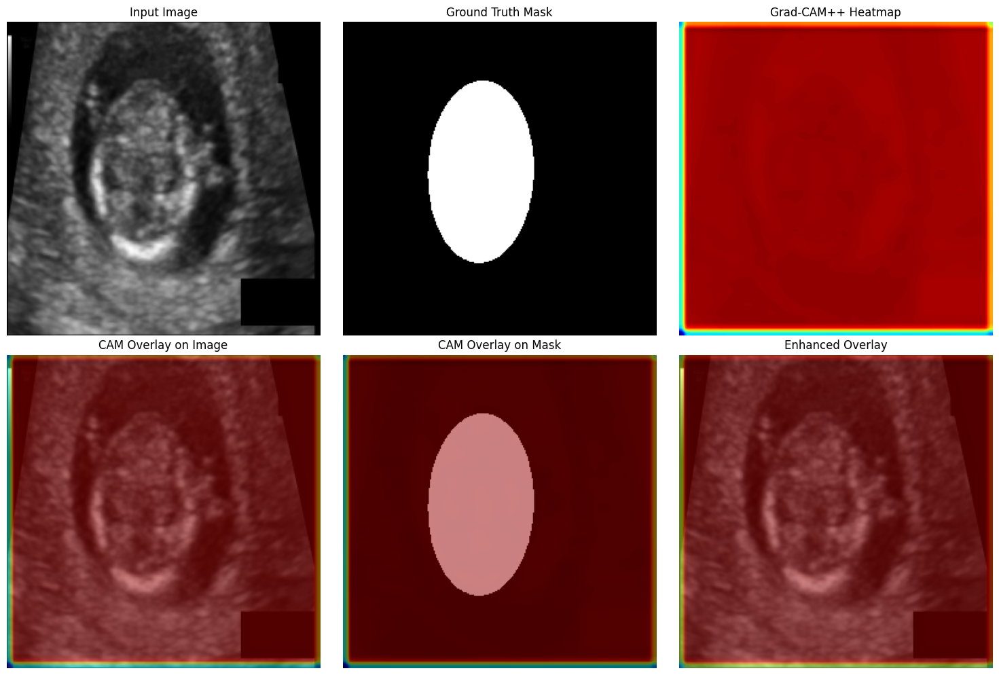

Analyzing sample 2/3


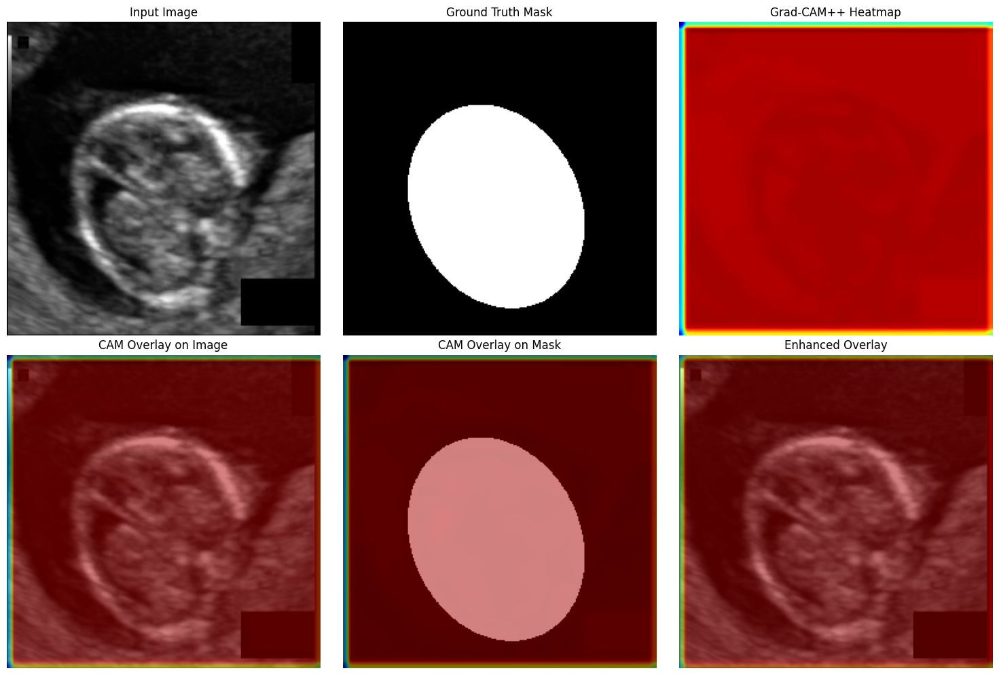

Analyzing sample 3/3


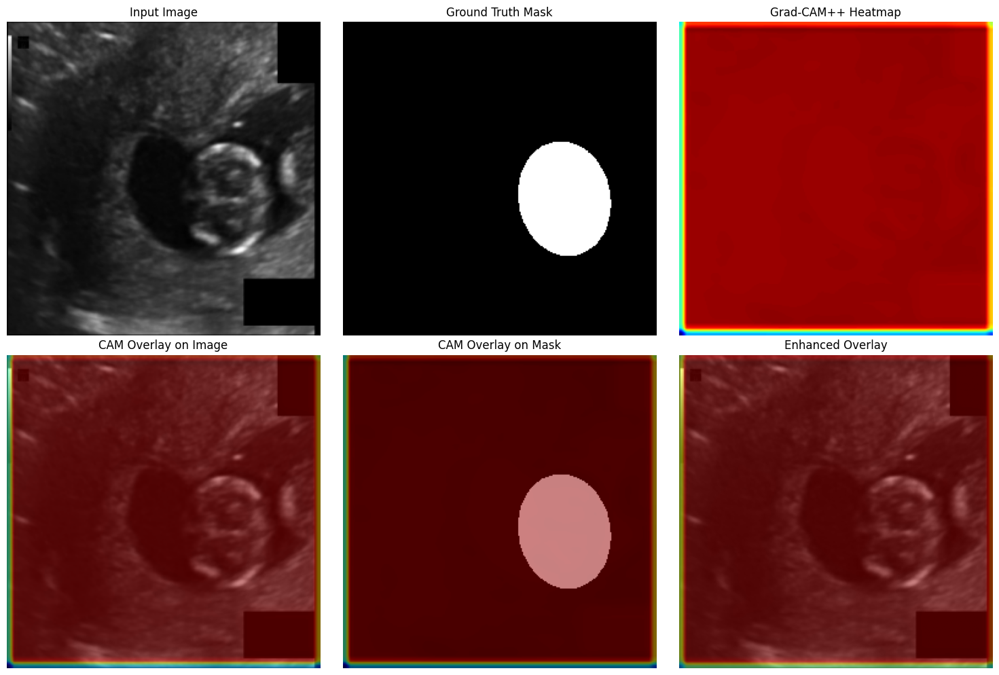

Comparing different noise levels...
Using target layer: cond_model.bottleneck.0
Using target layer: cond_model.bottleneck.0
Using target layer: cond_model.bottleneck.0


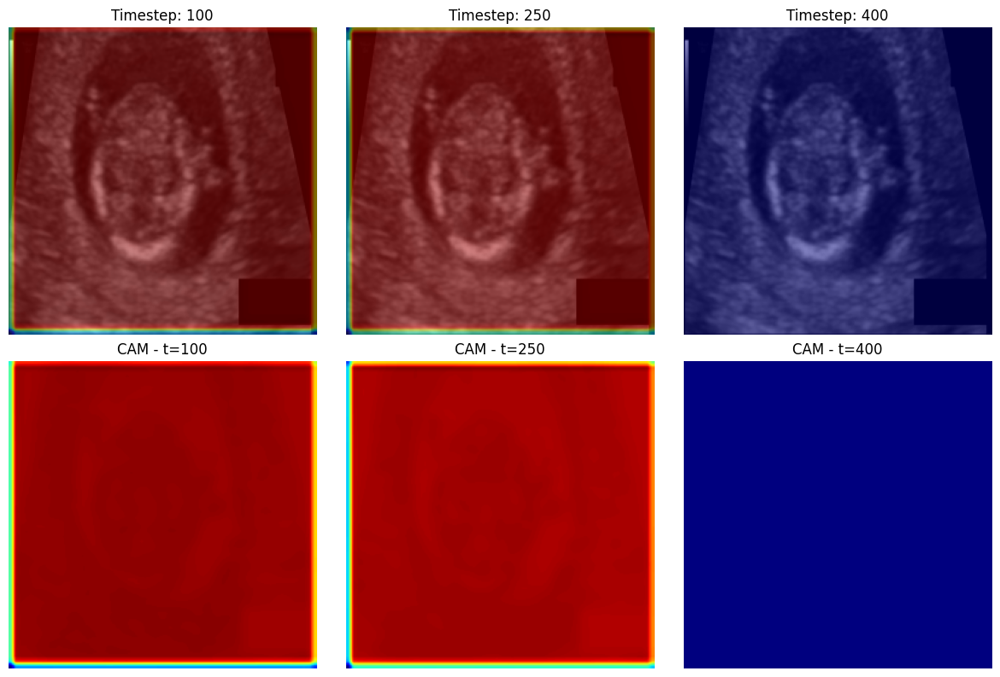

Detailed analysis of first sample...
Using target layer: cond_model.bottleneck.0
Grad-CAM++ Metrics: {'dice': np.float64(0.26744923857864483), 'iou': np.float64(0.15436733199045438), 'precision': np.float64(0.15436733199045438), 'recall': np.float64(0.9999999999990113)}
Saved visualization to /content/gradcam_detailed_analysis.png


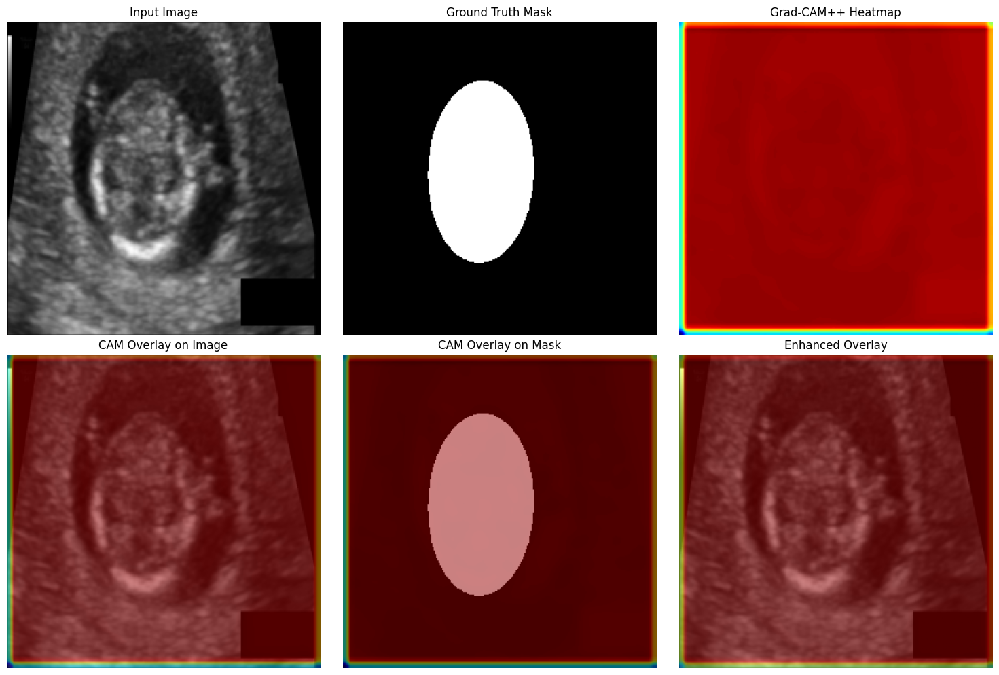

Grad-CAM++ analysis completed!


In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image

class CustomGradCAMPlusPlus:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        # Register hooks
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()

        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()

        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_full_backward_hook(backward_hook)

    def generate_cam(self, input_tensor, condition_tensor, timestep=250):
        """
        Generate custom Grad-CAM++ visualization for diffusion model
        """
        self.model.zero_grad()

        # Forward pass
        t = torch.tensor([timestep]).to(input_tensor.device)
        output = self.model(input_tensor, condition_tensor, t)

        # Use the output to compute gradients
        # For segmentation, we can use the mean of all output channels
        if output.shape[1] > 1:
            # For multi-channel output, use the channel with max activation
            target = output.mean(dim=(2, 3))  # [B, C]
            target = target.max(dim=1)[0]  # [B]
        else:
            # For single channel, use mean of spatial dimensions
            target = output.mean(dim=(1, 2, 3))  # [B]

        # Backward pass
        target.sum().backward(retain_graph=True)

        # Get gradients and activations
        gradients = self.gradients[0].cpu().numpy()  # [C, H, W]
        activations = self.activations[0].cpu().numpy()  # [C, H, W]

        # Grad-CAM++ calculations
        weights = self._calculate_weights(gradients, activations)

        # Weighted combination of activation maps
        cam = np.zeros(activations.shape[1:], dtype=np.float32)
        for i, w in enumerate(weights):
            cam += w * activations[i, :, :]

        # Apply ReLU
        cam = np.maximum(cam, 0)

        # Normalize
        if cam.max() > 0:
            cam = cam / cam.max()

        # Resize to input size
        cam = cv2.resize(cam, input_tensor.shape[2:])

        return cam

    def _calculate_weights(self, gradients, activations):
        """Calculate weights for Grad-CAM++"""
        # First, second, and third order derivatives
        first_deriv = gradients
        second_deriv = gradients ** 2
        third_deriv = gradients ** 3

        # Global sum
        global_sum = activations.sum(axis=(1, 2))

        # Alpha weights calculation
        alpha_denom = 2.0 * second_deriv + third_deriv * global_sum[:, None, None]
        alpha_denom = np.where(alpha_denom != 0.0, alpha_denom, 1e-8)
        alphas = second_deriv / alpha_denom

        # Normalize alpha
        alpha_norm = alphas.sum(axis=(1, 2))
        alpha_norm = np.where(alpha_norm != 0.0, alpha_norm, 1e-8)
        alphas = alphas / alpha_norm[:, None, None]

        # Calculate weights
        weights = (first_deriv * alphas).sum(axis=(1, 2))

        return weights

class DiffusionModelWrapper:
    def __init__(self, model, device, timestep=250):
        self.model = model
        self.device = device
        self.timestep = timestep

    def prepare_inputs(self, image, mask):
        """Prepare inputs for Grad-CAM"""
        diffusion = Diffusion()
        t = torch.tensor([self.timestep]).to(self.device)
        noisy_mask, _ = diffusion.noise_images(mask, t)
        return noisy_mask, image

    def get_target_layer(self):
        """Find a good target layer for Grad-CAM"""
        # Try to find the bottleneck layer
        for name, module in self.model.named_modules():
            if 'bottleneck' in name and isinstance(module, torch.nn.Conv2d):
                print(f"Using target layer: {name}")
                return module

        # Fallback: use the last encoder layer
        for name, module in self.model.named_modules():
            if 'enc3' in name and isinstance(module, torch.nn.Sequential):
                print(f"Using fallback target layer: {name}")
                return module[-1]  # Last layer in the sequential

        # Final fallback: use any Conv2d layer
        for name, module in self.model.named_modules():
            if isinstance(module, torch.nn.Conv2d):
                print(f"Using final fallback target layer: {name}")
                return module

        raise ValueError("No suitable target layer found for Grad-CAM")

class GradCAMVisualizer:
    def __init__(self, model, device, timestep=250):
        self.model = model
        self.device = device
        self.timestep = timestep
        self.wrapper = DiffusionModelWrapper(model, device, timestep)

        # Get target layer
        self.target_layer = self.wrapper.get_target_layer()
        self.grad_cam = CustomGradCAMPlusPlus(model, self.target_layer)

    def generate_heatmap(self, image, mask):
        """Generate Grad-CAM++ heatmap"""
        # Prepare inputs
        noisy_mask, condition_image = self.wrapper.prepare_inputs(image, mask)

        # Generate CAM
        with torch.enable_grad():
            self.model.eval()
            cam = self.grad_cam.generate_cam(noisy_mask, condition_image, self.timestep)

        return cam

    def visualize(self, image, mask, cam, save_path=None):
        """Visualize results with Grad-CAM++ overlay"""
        # Convert tensors to numpy
        img_np = image[0, 0].cpu().numpy()
        mask_np = mask[0, 0].cpu().numpy()

        # Normalize image for visualization
        img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())

        # Create colormap for CAM
        heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
        heatmap = heatmap / 255.0

        # Resize heatmap to match image size if needed
        if heatmap.shape[:2] != img_np.shape:
            heatmap = cv2.resize(heatmap, (img_np.shape[1], img_np.shape[0]))

        # Create overlay
        img_rgb = np.stack([img_np] * 3, axis=-1)  # Convert to RGB
        overlay = 0.5 * img_rgb + 0.5 * heatmap
        overlay = np.clip(overlay, 0, 1)

        # Create figure
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))

        # Original image
        axes[0, 0].imshow(img_np, cmap='gray')
        axes[0, 0].set_title('Input Image')
        axes[0, 0].axis('off')

        # Ground truth mask
        axes[0, 1].imshow(mask_np, cmap='gray')
        axes[0, 1].set_title('Ground Truth Mask')
        axes[0, 1].axis('off')

        # CAM heatmap
        axes[0, 2].imshow(cam, cmap='jet')
        axes[0, 2].set_title('Grad-CAM++ Heatmap')
        axes[0, 2].axis('off')

        # Overlay on image
        axes[1, 0].imshow(img_np, cmap='gray')
        axes[1, 0].imshow(cam, cmap='jet', alpha=0.5)
        axes[1, 0].set_title('CAM Overlay on Image')
        axes[1, 0].axis('off')

        # Overlay on mask
        axes[1, 1].imshow(mask_np, cmap='gray')
        axes[1, 1].imshow(cam, cmap='jet', alpha=0.5)
        axes[1, 1].set_title('CAM Overlay on Mask')
        axes[1, 1].axis('off')

        # Enhanced overlay
        axes[1, 2].imshow(overlay)
        axes[1, 2].set_title('Enhanced Overlay')
        axes[1, 2].axis('off')

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"Saved visualization to {save_path}")

        plt.show()

        return fig

def analyze_multiple_samples_with_gradcam(model, test_loader, num_samples=5, save_dir=None):
    """Analyze multiple test samples with Grad-CAM++"""
    visualizer = GradCAMVisualizer(model, device)

    # Get test samples
    test_samples = []
    for images, masks in test_loader:
        test_samples.append((images, masks))
        if len(test_samples) >= num_samples:
            break

    # Analyze each sample
    for i, (images, masks) in enumerate(test_samples):
        print(f"Analyzing sample {i+1}/{num_samples}")

        # Move to device
        image_sample = images[0:1].to(device)
        mask_sample = masks[0:1].to(device)

        # Generate CAM
        cam = visualizer.generate_heatmap(image_sample, mask_sample)

        # Visualize
        save_path = f"{save_dir}/gradcam_sample_{i+1}.png" if save_dir else None
        visualizer.visualize(image_sample, mask_sample, cam, save_path)

def compare_different_timesteps(model, test_loader, timesteps=[100, 250, 400], sample_idx=0):
    """Compare Grad-CAM++ at different noise levels"""
    # Get a test sample
    images, masks = next(iter(test_loader))
    image_sample = images[sample_idx:sample_idx+1].to(device)
    mask_sample = masks[sample_idx:sample_idx+1].to(device)

    fig, axes = plt.subplots(2, len(timesteps), figsize=(4*len(timesteps), 8))

    for i, timestep in enumerate(timesteps):
        visualizer = GradCAMVisualizer(model, device, timestep=timestep)
        cam = visualizer.generate_heatmap(image_sample, mask_sample)

        # Original image
        img_np = image_sample[0, 0].cpu().numpy()
        img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())

        # Plot
        axes[0, i].imshow(img_np, cmap='gray')
        axes[0, i].imshow(cam, cmap='jet', alpha=0.5)
        axes[0, i].set_title(f'Timestep: {timestep}')
        axes[0, i].axis('off')

        axes[1, i].imshow(cam, cmap='jet')
        axes[1, i].set_title(f'CAM - t={timestep}')
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()

# Utility function for quantitative analysis
def calculate_cam_metrics(cam, mask, threshold=0.3):
    """Calculate quantitative metrics for CAM quality"""
    cam_binary = (cam > threshold).astype(np.uint8)
    mask_binary = (mask > 0.5).astype(np.uint8)

    intersection = np.logical_and(cam_binary, mask_binary).sum()
    union = np.logical_or(cam_binary, mask_binary).sum()

    dice = (2. * intersection) / (cam_binary.sum() + mask_binary.sum() + 1e-8)
    iou = intersection / (union + 1e-8)
    precision = intersection / (cam_binary.sum() + 1e-8)
    recall = intersection / (mask_binary.sum() + 1e-8)

    return {'dice': dice, 'iou': iou, 'precision': precision, 'recall': recall}

# Main execution
if __name__ == "__main__":
    # Load your trained model
    model = MedSegDiffV2UNet(img_size=img_size).to(device)
    model.load_state_dict(torch.load(model_save_path, map_location=device))
    model.eval()
    print("Model loaded successfully!")

    # Get test loader
    _, _, test_loader = get_data_loaders()

    # Analyze multiple samples
    print("Generating Grad-CAM++ visualizations...")
    analyze_multiple_samples_with_gradcam(model, test_loader, num_samples=3)

    # Compare different timesteps
    print("Comparing different noise levels...")
    compare_different_timesteps(model, test_loader)

    # Detailed analysis of first sample
    print("Detailed analysis of first sample...")
    images, masks = next(iter(test_loader))
    image_sample = images[0:1].to(device)
    mask_sample = masks[0:1].to(device)

    visualizer = GradCAMVisualizer(model, device)
    cam = visualizer.generate_heatmap(image_sample, mask_sample)

    # Calculate metrics
    mask_np = mask_sample[0, 0].cpu().numpy()
    metrics = calculate_cam_metrics(cam, mask_np)
    print("Grad-CAM++ Metrics:", metrics)

    # Visualize
    visualizer.visualize(image_sample, mask_sample, cam,
                        save_path="/content/gradcam_detailed_analysis.png")

    print("Grad-CAM++ analysis completed!")

Model loaded successfully!
Generating Grad-CAM++ visualizations...
Analyzing sample 1/3
Using target layer: bottleneck.Conv2d


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:1864: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


Saved visualization to /content/gradcam_results/gradcam_sample_1.png


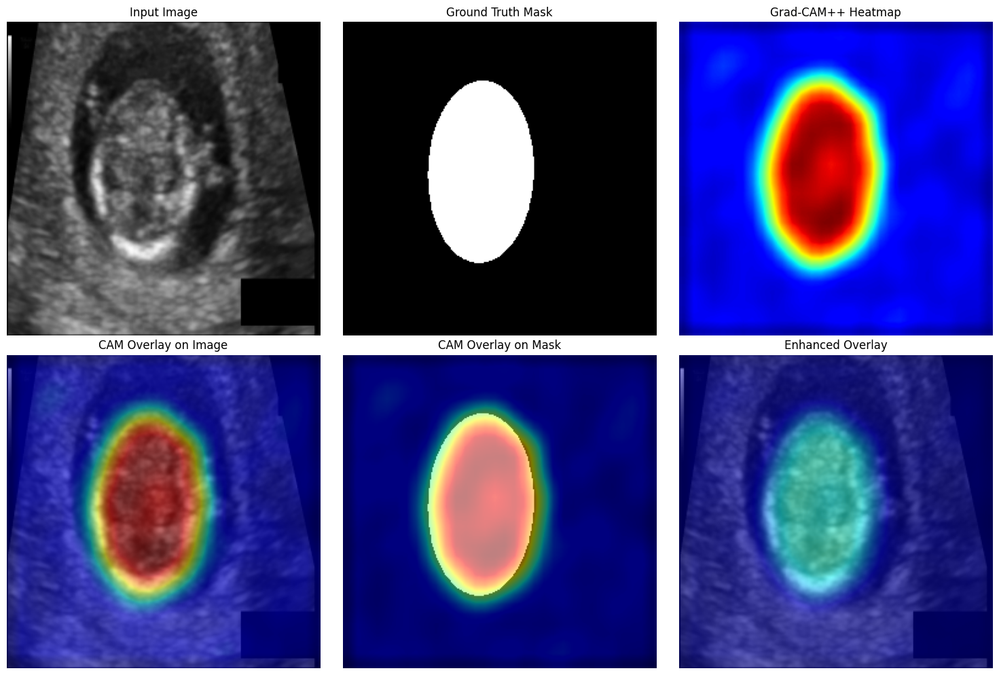

Analyzing sample 2/3
Using target layer: bottleneck.Conv2d
Saved visualization to /content/gradcam_results/gradcam_sample_2.png


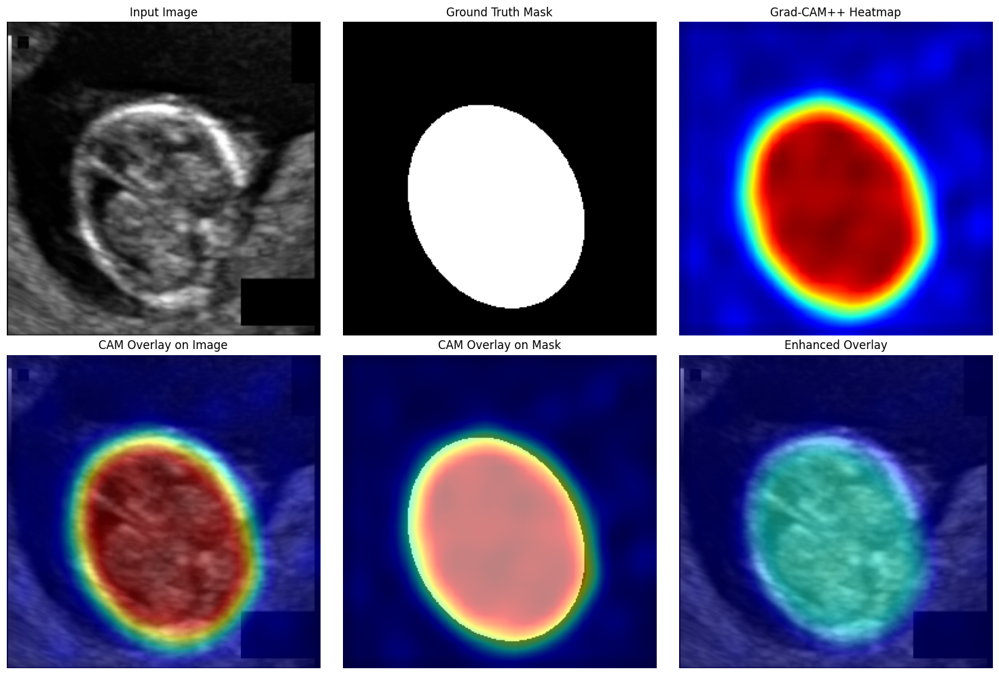

Analyzing sample 3/3
Using target layer: bottleneck.Conv2d
Saved visualization to /content/gradcam_results/gradcam_sample_3.png


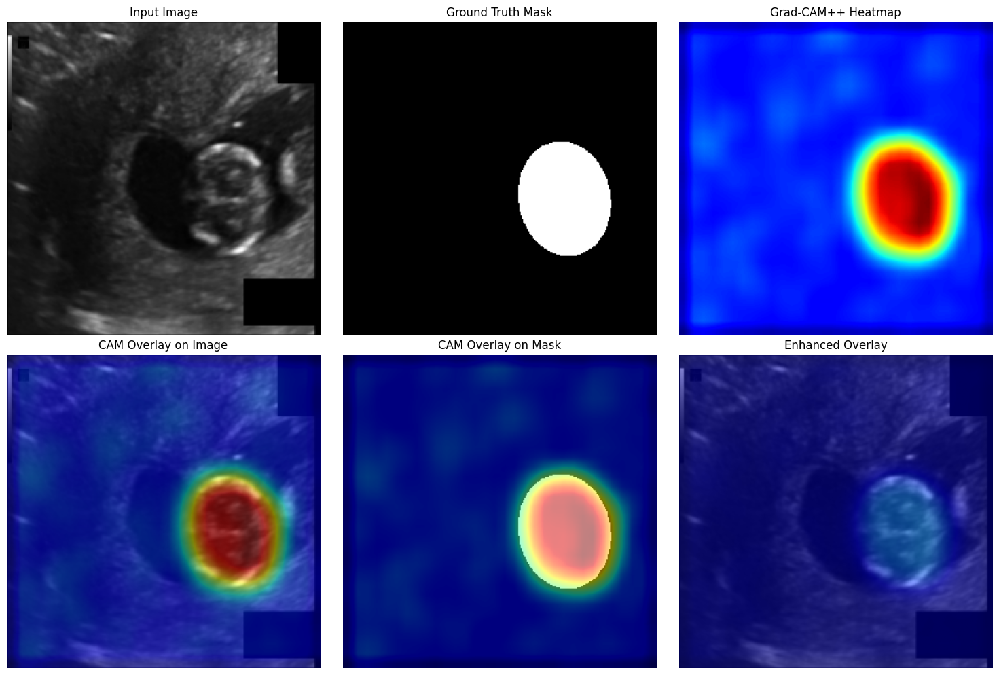

Comparing different layers...


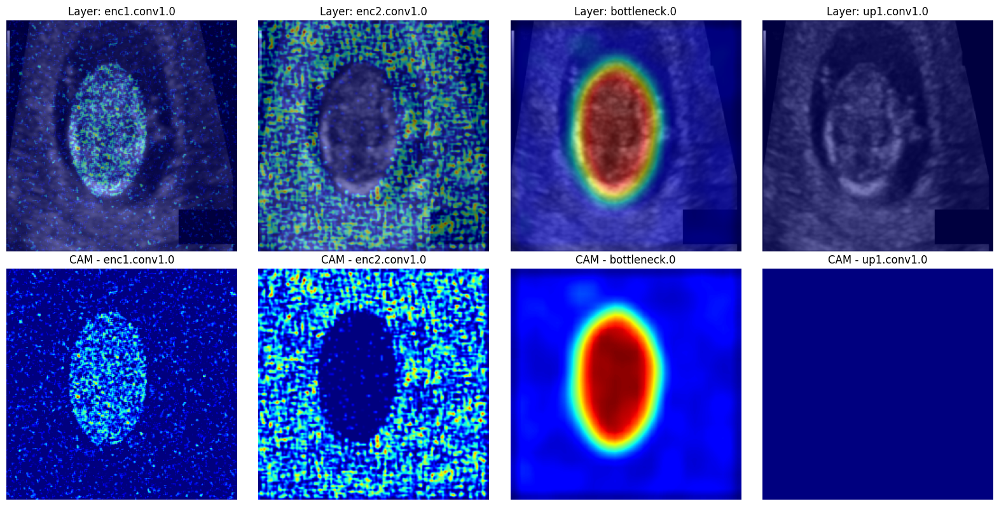

Detailed analysis of first sample...
Using target layer: bottleneck.Conv2d
Grad-CAM++ Metrics: {'dice': np.float64(0.887683541529209), 'iou': np.float64(0.7980494532550506), 'precision': np.float64(0.9956981317588549), 'recall': np.float64(0.8008105970731506)}
Saved visualization to /content/gradcam_detailed_analysis.png


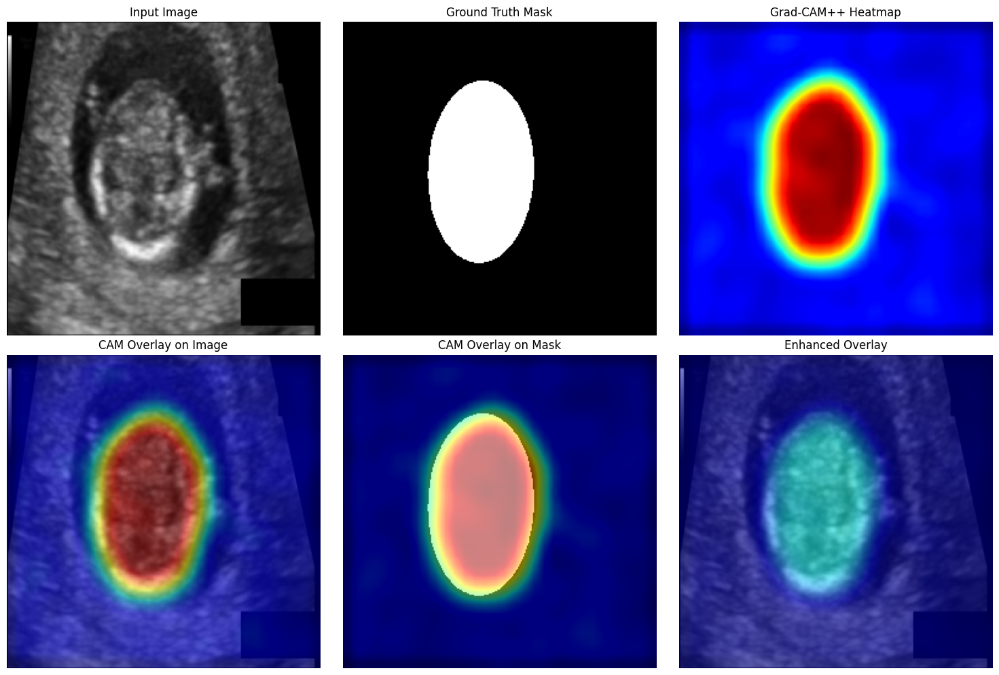

Grad-CAM++ analysis completed!


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import cv2
from pytorch_grad_cam.utils.image import show_cam_on_image # Keep this for visualization utility

# Custom Grad-CAM++ implementation and related classes
class CustomGradCAMPlusPlus:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        # Register hooks
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output

        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0]

        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def generate_cam(self, input_tensor, condition_tensor, target_category=None):
        """
        Generate custom Grad-CAM++ visualization
        """
        # Forward pass
        model_output = self.model(input_tensor, condition_tensor,
                                 torch.tensor([250]).to(input_tensor.device))

        # Use the mean of the output mask as the target for gradients
        # For segmentation, we are interested in the overall activation related to the mask
        # Calculate mean across spatial dimensions and the channel dimension (assuming [B, 1, H, W])
        target = model_output.mean(dim=(1, 2, 3)).sum() # Sum over batch dimension to get a scalar


        # Backward pass
        self.model.zero_grad()
        target.backward(retain_graph=True)

        # Get gradients and activations
        gradients = self.gradients[0].cpu().data.numpy()  # [C, H, W]
        activations = self.activations[0].cpu().data.numpy()  # [C, H, W]

        # Grad-CAM++ calculations
        weights = self._calculate_weights(gradients, activations)
        cam = np.zeros(activations.shape[1:], dtype=np.float32)

        # Weighted combination of activation maps
        for i, w in enumerate(weights):
            cam += w * activations[i, :, :]

        # Apply ReLU
        cam = np.maximum(cam, 0)

        # Normalize
        cam = cam / (cam.max() + 1e-8)

        # Resize to input size (assuming spatial dimensions of model output match input)
        # If model output spatial size is different, use the input_tensor shape for resizing
        cam = cv2.resize(cam, (input_tensor.shape[3], input_tensor.shape[2]))

        return cam

    def _calculate_weights(self, gradients, activations):
        """Calculate weights for Grad-CAM++"""
        # First order derivatives
        first_derivatives = gradients

        # Second order derivatives
        second_derivatives = gradients ** 2

        # Third order derivatives
        third_derivatives = gradients ** 3

        # Global sum
        global_sum = activations.sum(axis=(1, 2))

        # Alpha weights
        alpha_denominator = 2.0 * second_derivatives + third_derivatives * global_sum[:, None, None]
        alpha_denominator = np.where(alpha_denominator != 0.0, alpha_denominator, 1e-8)
        alphas = second_derivatives / alpha_denominator

        # Normalize alpha
        alpha_normalization_constant = alphas.sum(axis=(1, 2))
        alpha_normalization_constant = np.where(alpha_normalization_constant != 0.0,
                                               alpha_normalization_constant, 1e-8)
        alphas = alphas / alpha_normalization_constant[:, None, None]

        # Weights
        weights = (first_derivatives * alphas).sum(axis=(1, 2))

        return weights

# Wrapper class to make the diffusion model compatible with Grad-CAM (Not used with custom implementation but kept for context)
# class DiffusionModelWrapper(torch.nn.Module):
#     def __init__(self, model, timestep=250):
#         super().__init__()
#         self.model = model
#         self.timestep = torch.tensor([timestep]).to(device)

#     def forward(self, x, condition):
#         # x: noisy mask, condition: image
#         t = self.timestep.repeat(x.shape[0])
#         return self.model(x, condition, t)


class GradCAMVisualizer:
    def __init__(self, model, device, timestep=250, target_layer=None):
        self.model = model
        self.device = device
        self.timestep = timestep
        # The custom Grad-CAM++ implementation doesn't need a wrapper
        # It takes the model and inputs directly
        self.target_layer = target_layer if target_layer else self._get_target_layer()
        self.grad_cam = CustomGradCAMPlusPlus(model, self.target_layer)


    def _get_target_layer(self):
        """Find a good target layer for Grad-CAM"""
        # Try to find the bottleneck layer
        for name, module in self.model.named_modules():
            # The MedSegDiffV2UNet bottleneck has a sequential block,
            # we can target the first Conv2d within it
            if name == 'bottleneck':
                print(f"Using target layer: {name}.{module[0].__class__.__name__}")
                return module[0] # Target the first layer in the bottleneck sequential

        # Fallback: use the last encoder layer
        for name, module in self.model.named_modules():
            if 'enc3' in name and isinstance(module, torch.nn.Sequential):
                 print(f"Using fallback target layer: {name}.{module[-1].__class__.__name__}")
                 return module[-1][0] # Target the first Conv2d in the last layer of enc3

        # Final fallback: use any Conv2d layer
        for name, module in self.model.named_modules():
            if isinstance(module, torch.nn.Conv2d):
                print(f"Using final fallback target layer: {name}")
                return module

        raise ValueError("No suitable target layer found for Grad-CAM")

    def generate_heatmap(self, image, mask):
        """Generate Grad-CAM++ heatmap"""
        # Prepare inputs with a fixed timestep for consistent CAM
        diffusion = Diffusion()
        t = torch.tensor([self.timestep]).to(self.device)
        noisy_mask, _ = diffusion.noise_images(mask, t)

        # Generate CAM using the custom implementation
        # Remove torch.no_grad() to allow gradient calculation
        self.model.eval() # Set model to evaluation mode
        cam = self.grad_cam.generate_cam(noisy_mask, image)

        return cam

    def visualize(self, image, mask, cam, save_path=None):
        """Visualize results with Grad-CAM++ overlay"""
        # Convert tensors to numpy
        img_np = image[0, 0].cpu().numpy()
        mask_np = mask[0, 0].cpu().numpy()

        # Normalize image for visualization
        img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())

        # Create colormap for CAM
        heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
        heatmap = heatmap / 255.0

        # Resize heatmap to match image size if needed
        if heatmap.shape[:2] != img_np.shape:
             # Resize CAM to match the original image dimensions for overlay
            cam_resized = cv2.resize(cam, (img_np.shape[1], img_np.shape[0]))
            heatmap_resized = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
            heatmap_resized = cv2.cvtColor(heatmap_resized, cv2.COLOR_BGR2RGB) / 255.0
        else:
            heatmap_resized = heatmap


        # Create overlay
        img_rgb = np.stack([img_np] * 3, axis=-1)  # Convert to RGB
        overlay = 0.5 * img_rgb + 0.5 * heatmap_resized
        overlay = np.clip(overlay, 0, 1)


        # Create figure
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))

        # Original image
        axes[0, 0].imshow(img_np, cmap='gray')
        axes[0, 0].set_title('Input Image')
        axes[0, 0].axis('off')

        # Ground truth mask
        axes[0, 1].imshow(mask_np, cmap='gray')
        axes[0, 1].set_title('Ground Truth Mask')
        axes[0, 1].axis('off')

        # CAM heatmap (resized for visualization)
        axes[0, 2].imshow(cam_resized if 'cam_resized' in locals() else cam, cmap='jet')
        axes[0, 2].set_title('Grad-CAM++ Heatmap')
        axes[0, 2].axis('off')

        # Overlay on image
        axes[1, 0].imshow(img_np, cmap='gray')
        axes[1, 0].imshow(cam_resized if 'cam_resized' in locals() else cam, cmap='jet', alpha=0.5)
        axes[1, 0].set_title('CAM Overlay on Image')
        axes[1, 0].axis('off')

        # Overlay on mask
        axes[1, 1].imshow(mask_np, cmap='gray')
        axes[1, 1].imshow(cam_resized if 'cam_resized' in locals() else cam, cmap='jet', alpha=0.5)
        axes[1, 1].set_title('CAM Overlay on Mask')
        axes[1, 1].axis('off')

        # Enhanced overlay
        axes[1, 2].imshow(overlay)
        axes[1, 2].set_title('Enhanced Overlay')
        axes[1, 2].axis('off')


        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"Saved visualization to {save_path}")

        plt.show()

        return fig


# Utility function for quantitative analysis
def calculate_cam_metrics(cam, mask, threshold=0.3):
    """Calculate quantitative metrics for CAM quality"""
    # Resize CAM to match mask size if needed
    if cam.shape != mask.shape:
        cam = cv2.resize(cam, (mask.shape[1], mask.shape[0]))

    cam_binary = (cam > threshold).astype(np.uint8)
    mask_binary = (mask > 0.5).astype(np.uint8)

    intersection = np.logical_and(cam_binary, mask_binary).sum()
    union = np.logical_or(cam_binary, mask_binary).sum()

    dice = (2. * intersection) / (cam_binary.sum() + mask_binary.sum() + 1e-8)
    iou = intersection / (union + 1e-8)
    precision = intersection / (cam_binary.sum() + 1e-8)
    recall = intersection / (mask_binary.sum() + 1e-8)

    return {'dice': dice, 'iou': iou, 'precision': precision, 'recall': recall}


def analyze_multiple_samples(model, test_loader, num_samples=5, save_dir=None):
    """
    Analyze multiple test samples with Grad-CAM++ using the custom implementation
    """
    # Get test samples
    test_samples = []
    for images, masks in test_loader:
        test_samples.append((images, masks))
        if len(test_samples) >= num_samples:
            break

    # Analyze each sample
    for i, (images, masks) in enumerate(test_samples):
        print(f"Analyzing sample {i+1}/{num_samples}")

        # Move to device
        image_sample = images[0:1].to(device)
        mask_sample = masks[0:1].to(device)

        # Initialize visualizer for each sample to find the target layer
        visualizer = GradCAMVisualizer(model, device)

        # Generate CAM using the custom visualizer
        cam = visualizer.generate_heatmap(image_sample, mask_sample)

        # Visualize using the custom visualizer
        save_path = f"{save_dir}/gradcam_sample_{i+1}.png" if save_dir else None
        visualizer.visualize(image_sample, mask_sample, cam, save_path)

def compare_different_layers(model, test_loader, layer_names, sample_idx=0):
    """
    Compare Grad-CAM++ visualizations from different layers using the custom implementation
    """
    # Get a test sample
    images, masks = next(iter(test_loader))
    image_sample = images[sample_idx:sample_idx+1].to(device)
    mask_sample = masks[sample_idx:sample_idx+1].to(device)

    fig, axes = plt.subplots(2, len(layer_names), figsize=(4*len(layer_names), 8))

    for i, layer_name in enumerate(layer_names):
        # Find the layer
        target_layer = None
        # Special handling for sequential layers like in the bottleneck
        if layer_name == 'bottleneck.0':
            target_layer = model.bottleneck[0]
        else:
            for name, module in model.named_modules():
                if name == layer_name:
                    target_layer = module
                    break

        if target_layer is None:
            print(f"Layer {layer_name} not found, skipping...")
            continue

        # Initialize visualizer with the specific target layer
        visualizer = GradCAMVisualizer(model, device, target_layer=target_layer)

        # Generate CAM for this layer
        cam = visualizer.generate_heatmap(image_sample, mask_sample)

        # Original image
        img_np = image_sample[0, 0].cpu().numpy()
        img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())

        # Plot
        axes[0, i].imshow(img_np, cmap='gray')
        axes[0, i].imshow(cam, cmap='jet', alpha=0.5)
        axes[0, i].set_title(f'Layer: {layer_name}')
        axes[0, i].axis('off')

        axes[1, i].imshow(cam, cmap='jet')
        axes[1, i].set_title(f'CAM - {layer_name}')
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()


# Usage after training
if __name__ == "__main__":
    # Load trained model
    model = MedSegDiffV2UNet(img_size=img_size).to(device)
    model.load_state_dict(torch.load(model_save_path, map_location=device))
    model.eval()
    print("Model loaded successfully!")

    # Get test loader
    _, _, test_loader = get_data_loaders()

    # Analyze multiple samples
    print("Generating Grad-CAM++ visualizations...")
    # Create the directory if it doesn't exist
    if not os.path.exists("/content/gradcam_results"):
        os.makedirs("/content/gradcam_results")
    analyze_multiple_samples(model, test_loader, num_samples=3, save_dir="/content/gradcam_results") # Reduced to 3 for quicker execution

    # Compare different layers (optional)
    layer_names_to_compare = [
        'enc1.conv1.0',  # First encoder layer
        'enc2.conv1.0',  # Second encoder layer
        'bottleneck.0',  # Bottleneck layer (targeting the first conv in the sequential)
        'up1.conv1.0',   # First decoder layer
    ]

    print("Comparing different layers...")
    compare_different_layers(model, test_loader, layer_names_to_compare)

    # Generate individual sample analysis
    print("Detailed analysis of first sample...")
    images, masks = next(iter(test_loader))
    image_sample = images[0:1].to(device)
    mask_sample = masks[0:1].to(device)

    # Initialize visualizer
    visualizer = GradCAMVisualizer(model, device)

    # Generate and visualize
    cam = visualizer.generate_heatmap(image_sample, mask_sample)

    # Calculate metrics
    mask_np = mask_sample[0, 0].cpu().numpy()
    metrics = calculate_cam_metrics(cam, mask_np)
    print("Grad-CAM++ Metrics:", metrics)

    visualizer.visualize(image_sample, mask_sample, cam,
                        save_path="/content/gradcam_detailed_analysis.png")

    print("Grad-CAM++ analysis completed!")

1. Visualizing Diffusion Process...


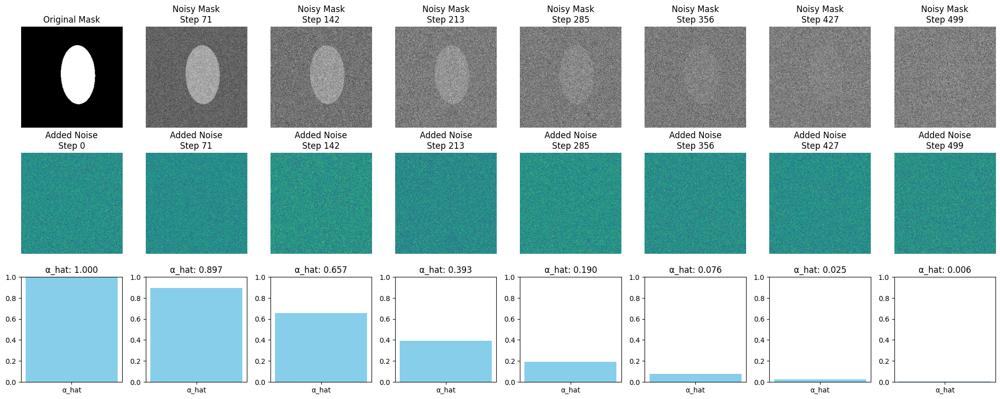

2. Visualizing Reverse Denoising Process...


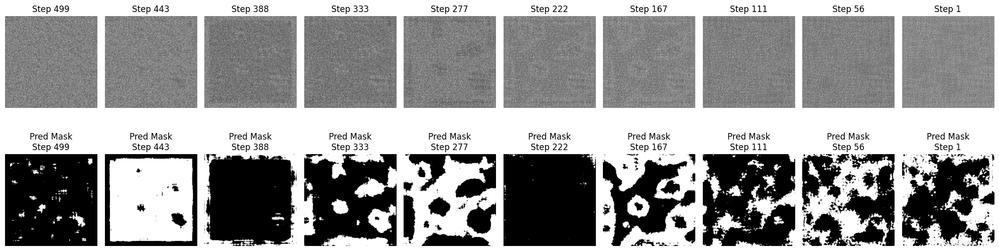

3. Visualizing Feature Maps...


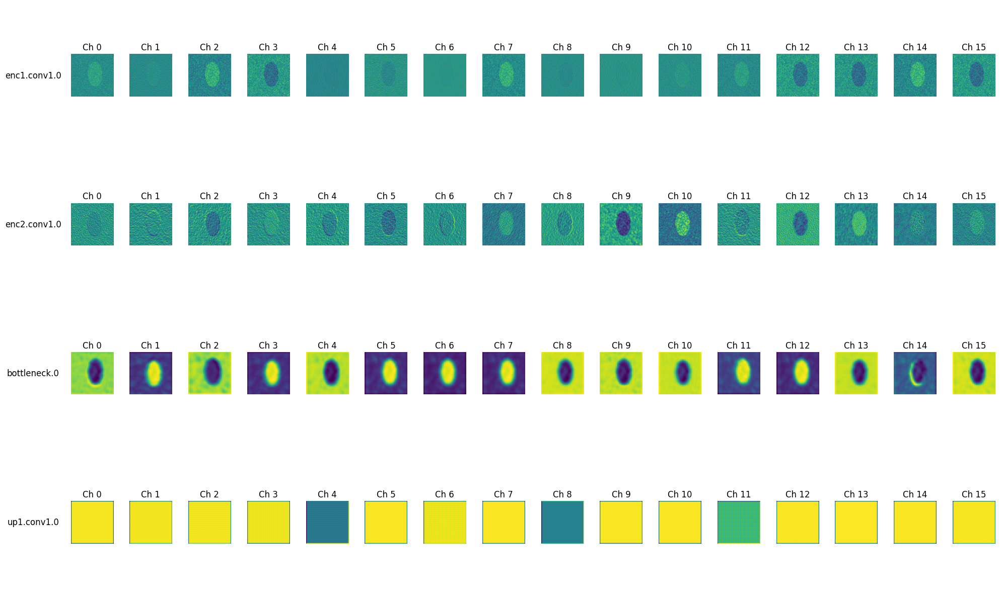

4. Visualizing Confidence Maps...


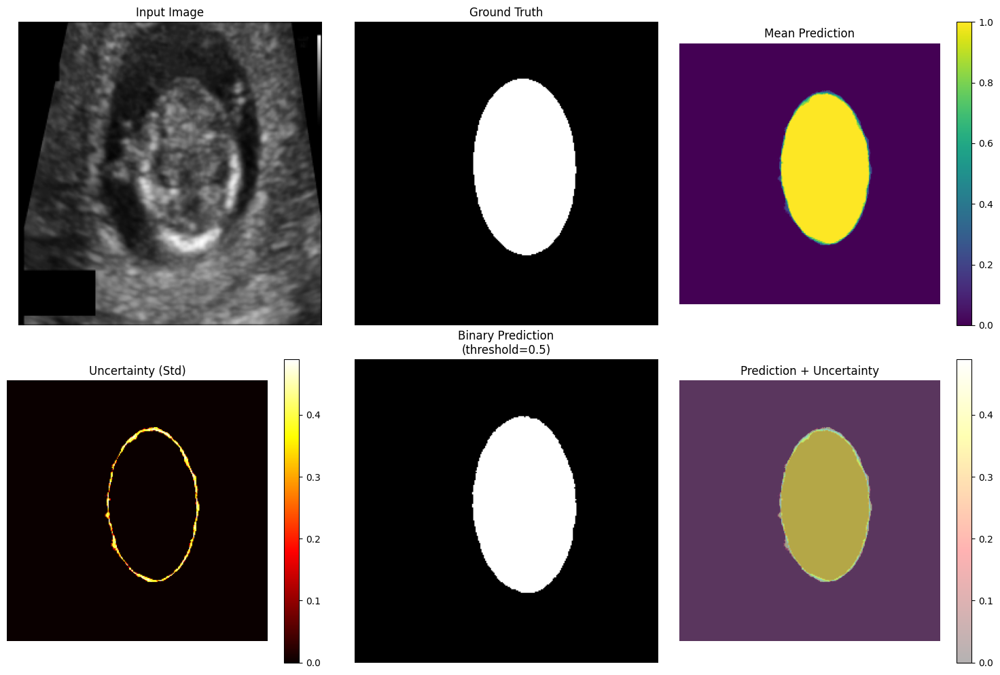

5. Creating Interactive 3D Visualization...


6. Visualizing Error Analysis...


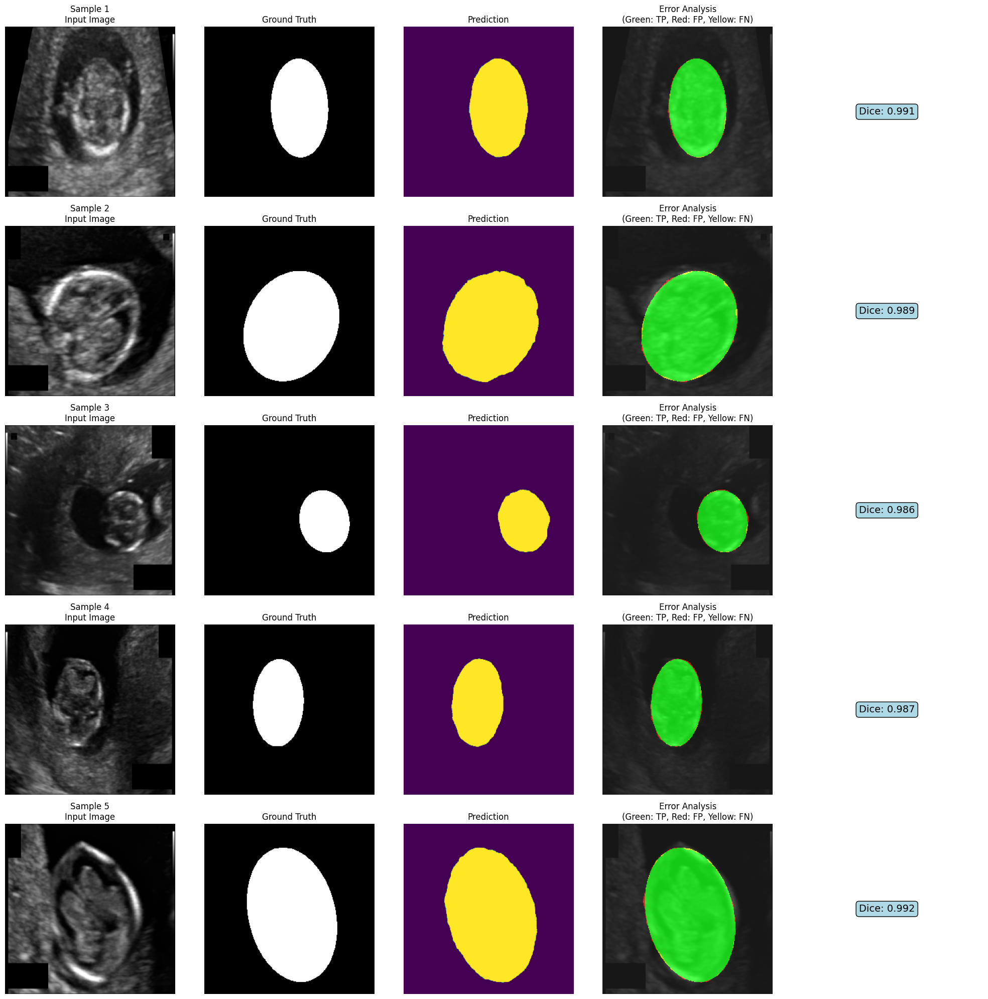

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

class AdvancedMedSegDiffVisualizer:
    def __init__(self, model, device, diffusion):
        self.model = model
        self.device = device
        self.diffusion = diffusion

    # 1. Diffusion Process Visualization
    def visualize_diffusion_process(self, image, mask, num_steps=8, save_path=None):
        """Visualize the forward diffusion process"""
        fig, axes = plt.subplots(3, num_steps, figsize=(20, 8))

        # Sample timesteps
        timesteps = torch.linspace(0, self.diffusion.noise_steps-1, num_steps).long()

        for i, t in enumerate(timesteps):
            # Add noise
            noisy_mask, noise = self.diffusion.noise_images(mask, t.unsqueeze(0))

            # Plot original mask
            if i == 0:
                axes[0, i].imshow(mask[0, 0].cpu(), cmap='gray')
                axes[0, i].set_title('Original Mask')
            else:
                axes[0, i].imshow(noisy_mask[0, 0].cpu(), cmap='gray')
                axes[0, i].set_title(f'Noisy Mask\nStep {t.item()}')
            axes[0, i].axis('off')

            # Plot noise
            axes[1, i].imshow(noise[0, 0].cpu(), cmap='viridis')
            axes[1, i].set_title(f'Added Noise\nStep {t.item()}')
            axes[1, i].axis('off')

            # Plot alpha values
            alpha_val = self.diffusion.alpha_hat[t].item()
            axes[2, i].bar(['α_hat'], [alpha_val], color='skyblue')
            axes[2, i].set_ylim(0, 1)
            axes[2, i].set_title(f'α_hat: {alpha_val:.3f}')

        plt.tight_layout()
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()

    # 2. Reverse Denoising Process
    def visualize_reverse_process(self, image, mask, num_steps=10, save_path=None):
        """Visualize the reverse denoising process"""
        # Start from pure noise
        x = torch.randn_like(mask).to(self.device)

        # Sample steps to visualize
        steps_to_show = np.linspace(self.diffusion.noise_steps-1, 1, num_steps).astype(int)

        fig, axes = plt.subplots(2, num_steps, figsize=(20, 6))

        predictions = []
        for i, step in enumerate(steps_to_show):
            t = torch.tensor([step]).to(self.device)

            with torch.no_grad():
                predicted_noise = self.model(x, image, t)

            # Store prediction
            pred_mask = torch.sigmoid(predicted_noise)
            predictions.append(pred_mask[0, 0].cpu().numpy())

            # Plot current state
            axes[0, i].imshow(x[0, 0].cpu(), cmap='gray')
            axes[0, i].set_title(f'Step {step}')
            axes[0, i].axis('off')

            # Plot predicted mask
            axes[1, i].imshow(pred_mask[0, 0].cpu(), cmap='gray')
            axes[1, i].set_title(f'Pred Mask\nStep {step}')
            axes[1, i].axis('off')

            # Update x for next step (simplified)
            if step > 1:
                alpha = self.diffusion.alpha[t][:, None, None, None]
                alpha_hat = self.diffusion.alpha_hat[t][:, None, None, None]
                beta = 1 - alpha

                x = (1 / torch.sqrt(alpha)) * (x - ((1 - alpha) / (torch.sqrt(1 - alpha_hat))) * predicted_noise)
                if step > 1:
                    noise = torch.randn_like(x)
                    x = x + torch.sqrt(beta) * noise

        plt.tight_layout()
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()

        return predictions

    # 3. Feature Map Visualization
    def visualize_feature_maps(self, image, mask, layer_names=None, num_maps=16, save_path=None):
        """Visualize feature maps from different layers"""
        if layer_names is None:
            layer_names = ['enc1.conv1.0', 'enc2.conv1.0', 'bottleneck.0', 'up1.conv1.0']

        # Hook to capture feature maps
        feature_maps = {}

        def get_hook(name):
            def hook(module, input, output):
                feature_maps[name] = output.detach()
            return hook

        # Register hooks
        hooks = []
        for name, module in self.model.named_modules():
            if name in layer_names:
                hooks.append(module.register_forward_hook(get_hook(name)))

        # Forward pass
        t = torch.tensor([250]).to(self.device)
        noisy_mask, _ = self.diffusion.noise_images(mask, t)
        with torch.no_grad():
            _ = self.model(noisy_mask, image, t)

        # Remove hooks
        for hook in hooks:
            hook.remove()

        # Visualize feature maps
        fig, axes = plt.subplots(len(layer_names), min(num_maps, 16) + 1, figsize=(20, 3*len(layer_names)))

        for i, layer_name in enumerate(layer_names):
            if layer_name not in feature_maps:
                continue

            fm = feature_maps[layer_name][0]  # First batch
            num_channels = min(fm.shape[0], num_maps)

            # Plot layer name
            axes[i, 0].text(0.5, 0.5, layer_name, ha='center', va='center', fontsize=12)
            axes[i, 0].axis('off')

            # Plot feature maps
            for j in range(num_channels):
                feature_map = fm[j].cpu().numpy()
                # Normalize for visualization
                feature_map = (feature_map - feature_map.min()) / (feature_map.max() - feature_map.min() + 1e-8)

                axes[i, j+1].imshow(feature_map, cmap='viridis')
                axes[i, j+1].set_title(f'Ch {j}')
                axes[i, j+1].axis('off')

        plt.tight_layout()
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()

        return feature_maps

    # 4. Attention Visualization
    def visualize_attention_maps(self, image, mask, save_path=None):
        """Visualize attention maps from SS-Former"""
        # Hook to capture attention (you might need to modify SSFormer to return attention)
        attention_maps = {}

        def attention_hook(module, input, output):
            # This is a placeholder - you'll need to modify your SSFormer to return attention weights
            if hasattr(module, 'attention_weights'):
                attention_maps['ssformer'] = module.attention_weights.detach()

        # Register hook on SSFormer (you'll need to adjust this based on your architecture)
        for name, module in self.model.named_modules():
            if 'ssformer' in name.lower() and isinstance(module, nn.MultiheadAttention):
                hook = module.register_forward_hook(attention_hook)
                break

        # Forward pass
        t = torch.tensor([250]).to(self.device)
        noisy_mask, _ = self.diffusion.noise_images(mask, t)
        with torch.no_grad():
            _ = self.model(noisy_mask, image, t)

        # Remove hook
        hook.remove()

        # Visualize if attention maps were captured
        if attention_maps:
            fig, axes = plt.subplots(2, 4, figsize=(15, 8))

            attn_map = attention_maps['ssformer'][0].cpu().numpy()  # First head, first batch

            # Plot different attention heads
            for i in range(min(8, attn_map.shape[0])):
                row, col = i // 4, i % 4
                im = axes[row, col].imshow(attn_map[i], cmap='hot', interpolation='nearest')
                axes[row, col].set_title(f'Head {i}')
                axes[row, col].axis('off')

                # Add colorbar
                divider = make_axes_locatable(axes[row, col])
                cax = divider.append_axes("right", size="5%", pad=0.05)
                plt.colorbar(im, cax=cax)

            plt.tight_layout()
            if save_path:
                plt.savefig(save_path, dpi=300, bbox_inches='tight')
            plt.show()

        return attention_maps

    # 5. Confidence Map Visualization
    def visualize_confidence_maps(self, image, mask, num_samples=5, save_path=None):
        """Visualize prediction confidence through multiple sampling"""
        all_predictions = []

        for i in range(num_samples):
            # Sample different noise
            t = torch.tensor([250]).to(self.device)
            noisy_mask, _ = self.diffusion.noise_images(mask, t)

            with torch.no_grad():
                output = self.model(noisy_mask, image, t)
                pred = torch.sigmoid(output)
                all_predictions.append(pred.cpu().numpy())

        all_predictions = np.array(all_predictions)  # [num_samples, B, C, H, W]
        mean_pred = all_predictions.mean(axis=0)[0, 0]  # Mean prediction
        std_pred = all_predictions.std(axis=0)[0, 0]   # Uncertainty

        # Visualization
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))

        # Original image
        img_np = image[0, 0].cpu().numpy()
        axes[0, 0].imshow(img_np, cmap='gray')
        axes[0, 0].set_title('Input Image')
        axes[0, 0].axis('off')

        # Ground truth
        mask_np = mask[0, 0].cpu().numpy()
        axes[0, 1].imshow(mask_np, cmap='gray')
        axes[0, 1].set_title('Ground Truth')
        axes[0, 1].axis('off')

        # Mean prediction
        im1 = axes[0, 2].imshow(mean_pred, cmap='viridis', vmin=0, vmax=1)
        axes[0, 2].set_title('Mean Prediction')
        axes[0, 2].axis('off')
        plt.colorbar(im1, ax=axes[0, 2])

        # Uncertainty (std)
        im2 = axes[1, 0].imshow(std_pred, cmap='hot')
        axes[1, 0].set_title('Uncertainty (Std)')
        axes[1, 0].axis('off')
        plt.colorbar(im2, ax=axes[1, 0])

        # Binary prediction with threshold
        binary_pred = (mean_pred > 0.5).astype(float)
        axes[1, 1].imshow(binary_pred, cmap='gray')
        axes[1, 1].set_title('Binary Prediction\n(threshold=0.5)')
        axes[1, 1].axis('off')

        # Overlay uncertainty on prediction
        axes[1, 2].imshow(mean_pred, cmap='viridis', alpha=0.7)
        uncertainty_overlay = axes[1, 2].imshow(std_pred, cmap='hot', alpha=0.3)
        axes[1, 2].set_title('Prediction + Uncertainty')
        axes[1, 2].axis('off')
        plt.colorbar(uncertainty_overlay, ax=axes[1, 2])

        plt.tight_layout()
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()

        return mean_pred, std_pred

    # 6. Interactive 3D Visualization
    def create_interactive_3d_visualization(self, image, mask, save_path=None):
        """Create interactive 3D visualization using plotly"""
        t = torch.tensor([250]).to(self.device)
        noisy_mask, _ = self.diffusion.noise_images(mask, t)

        with torch.no_grad():
            output = self.model(noisy_mask, image, t)
            pred = torch.sigmoid(output)[0, 0].cpu().numpy()

        # Create 3D surface
        x, y = np.mgrid[0:pred.shape[0], 0:pred.shape[1]]

        fig = make_subplots(
            rows=2, cols=2,
            specs=[[{'is_3d': True}, {'is_3d': True}],
                   [{'is_3d': True}, {'is_3d': True}]],
            subplot_titles=['Prediction Surface', 'Confidence Heatmap',
                          'Difference Map', '3D Segmentation']
        )

        # 3D prediction surface
        fig.add_trace(
            go.Surface(z=pred, colorscale='Viridis', showscale=False),
            row=1, col=1
        )

        # Ground truth surface
        gt = mask[0, 0].cpu().numpy()
        fig.add_trace(
            go.Surface(z=gt, colorscale='Greys', showscale=False),
            row=1, col=2
        )

        # Difference map
        diff = np.abs(pred - gt)
        fig.add_trace(
            go.Surface(z=diff, colorscale='Hot', showscale=False),
            row=2, col=1
        )

        # Binary segmentation in 3D
        binary_pred = (pred > 0.5).astype(float)
        fig.add_trace(
            go.Surface(z=binary_pred, colorscale='Blues', showscale=False),
            row=2, col=2
        )

        fig.update_layout(
            title_text="3D Segmentation Analysis",
            height=800
        )

        if save_path:
            fig.write_html(save_path)

        fig.show()

        return fig

    # 7. Training History Analysis
    def visualize_training_history(self, history, save_path=None):
        """Comprehensive training history visualization"""
        fig, axes = plt.subplots(2, 3, figsize=(18, 10))

        # Loss curve
        axes[0, 0].plot(history['train_loss'], label='Train Loss', linewidth=2)
        axes[0, 0].set_title('Training Loss')
        axes[0, 0].set_xlabel('Epoch')
        axes[0, 0].set_ylabel('Loss')
        axes[0, 0].legend()
        axes[0, 0].grid(True, alpha=0.3)

        # Dice scores
        axes[0, 1].plot(history['train_dice'], label='Train Dice', linewidth=2)
        axes[0, 1].plot(history['val_dice'], label='Val Dice', linewidth=2)
        axes[0, 1].set_title('Dice Score')
        axes[0, 1].set_xlabel('Epoch')
        axes[0, 1].set_ylabel('Dice')
        axes[0, 1].legend()
        axes[0, 1].grid(True, alpha=0.3)

        # IoU scores
        axes[0, 2].plot(history['train_iou'], label='Train IoU', linewidth=2)
        axes[0, 2].plot(history['val_iou'], label='Val IoU', linewidth=2)
        axes[0, 2].set_title('IoU Score')
        axes[0, 2].set_xlabel('Epoch')
        axes[0, 2].set_ylabel('IoU')
        axes[0, 2].legend()
        axes[0, 2].grid(True, alpha=0.3)

        # Learning rate (if available)
        if 'lr' in history:
            axes[1, 0].plot(history['lr'], color='purple', linewidth=2)
            axes[1, 0].set_title('Learning Rate')
            axes[1, 0].set_xlabel('Epoch')
            axes[1, 0].set_ylabel('LR')
            axes[1, 0].grid(True, alpha=0.3)

        # Gradient norms (if available)
        if 'grad_norm' in history:
            axes[1, 1].plot(history['grad_norm'], color='red', linewidth=2)
            axes[1, 1].set_title('Gradient Norm')
            axes[1, 1].set_xlabel('Epoch')
            axes[1, 1].set_ylabel('Norm')
            axes[1, 1].grid(True, alpha=0.3)

        # Combined metrics
        epochs = range(1, len(history['train_loss']) + 1)
        axes[1, 2].plot(epochs, history['train_dice'], label='Train Dice', linewidth=2)
        axes[1, 2].plot(epochs, history['val_dice'], label='Val Dice', linewidth=2)
        axes[1, 2].plot(epochs, history['train_iou'], label='Train IoU', linestyle='--', linewidth=2)
        axes[1, 2].plot(epochs, history['val_iou'], label='Val IoU', linestyle='--', linewidth=2)
        axes[1, 2].set_title('Combined Metrics')
        axes[1, 2].set_xlabel('Epoch')
        axes[1, 2].set_ylabel('Score')
        axes[1, 2].legend()
        axes[1, 2].grid(True, alpha=0.3)

        plt.tight_layout()
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()

    # 8. Error Analysis
    def visualize_error_analysis(self, test_loader, num_samples=5, save_path=None):
        """Visualize different types of errors"""
        samples = []
        for i, (images, masks) in enumerate(test_loader):
            if i >= num_samples:
                break
            samples.append((images, masks))

        fig, axes = plt.subplots(num_samples, 5, figsize=(20, 4*num_samples))

        for i, (images, masks) in enumerate(samples):
            image_sample = images[0:1].to(self.device)
            mask_sample = masks[0:1].to(self.device)

            # Prediction
            t = torch.tensor([250]).to(self.device)
            noisy_mask, _ = self.diffusion.noise_images(mask_sample, t)
            with torch.no_grad():
                output = self.model(noisy_mask, image_sample, t)
                pred = torch.sigmoid(output)
                binary_pred = (pred > 0.5).float()

            # Convert to numpy
            img_np = image_sample[0, 0].cpu().numpy()
            mask_np = mask_sample[0, 0].cpu().numpy()
            pred_np = pred[0, 0].cpu().numpy()
            binary_np = binary_pred[0, 0].cpu().numpy()

            # Calculate error types
            true_positive = (binary_np == 1) & (mask_np == 1)
            false_positive = (binary_np == 1) & (mask_np == 0)
            false_negative = (binary_np == 0) & (mask_np == 1)
            true_negative = (binary_np == 0) & (mask_np == 0)

            # Plot
            axes[i, 0].imshow(img_np, cmap='gray')
            axes[i, 0].set_title(f'Sample {i+1}\nInput Image')
            axes[i, 0].axis('off')

            axes[i, 1].imshow(mask_np, cmap='gray')
            axes[i, 1].set_title('Ground Truth')
            axes[i, 1].axis('off')

            axes[i, 2].imshow(pred_np, cmap='viridis', vmin=0, vmax=1)
            axes[i, 2].set_title('Prediction')
            axes[i, 2].axis('off')

            # Error map
            error_map = np.zeros((*mask_np.shape, 3))
            error_map[true_positive] = [0, 1, 0]  # Green - TP
            error_map[false_positive] = [1, 0, 0]  # Red - FP
            error_map[false_negative] = [1, 1, 0]  # Yellow - FN

            axes[i, 3].imshow(img_np, cmap='gray', alpha=0.7)
            axes[i, 3].imshow(error_map, alpha=0.7)
            axes[i, 3].set_title('Error Analysis\n(Green: TP, Red: FP, Yellow: FN)')
            axes[i, 3].axis('off')

            # Dice score for this sample
            intersection = (binary_np * mask_np).sum()
            union = binary_np.sum() + mask_np.sum()
            dice = (2. * intersection) / (union + 1e-8)

            axes[i, 4].text(0.5, 0.5, f'Dice: {dice:.3f}',
                           ha='center', va='center', fontsize=14,
                           bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue"))
            axes[i, 4].axis('off')

        plt.tight_layout()
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()

# Usage Example
def run_comprehensive_visualization(model, test_loader, history=None):
    """Run all visualization techniques"""
    # Initialize visualizer
    diffusion = Diffusion()
    visualizer = AdvancedMedSegDiffVisualizer(model, device, diffusion)

    # Get a sample
    images, masks = next(iter(test_loader))
    image_sample = images[0:1].to(device)
    mask_sample = masks[0:1].to(device)

    print("1. Visualizing Diffusion Process...")
    visualizer.visualize_diffusion_process(image_sample, mask_sample)

    print("2. Visualizing Reverse Denoising Process...")
    visualizer.visualize_reverse_process(image_sample, mask_sample)

    print("3. Visualizing Feature Maps...")
    visualizer.visualize_feature_maps(image_sample, mask_sample)

    print("4. Visualizing Confidence Maps...")
    visualizer.visualize_confidence_maps(image_sample, mask_sample)

    print("5. Creating Interactive 3D Visualization...")
    visualizer.create_interactive_3d_visualization(image_sample, mask_sample)

    print("6. Visualizing Error Analysis...")
    visualizer.visualize_error_analysis(test_loader)

    if history is not None:
        print("7. Visualizing Training History...")
        visualizer.visualize_training_history(history)

# Run the comprehensive visualization
if __name__ == "__main__":
    # Load your trained model
    model = MedSegDiffV2UNet(img_size=img_size).to(device)
    model.load_state_dict(torch.load(model_save_path, map_location=device))
    model.eval()

    # Get test loader
    _, _, test_loader = get_data_loaders()

    # Run all visualizations
    run_comprehensive_visualization(model, test_loader)